# Wasserstein GAN Time Series Augmentation

Other ideas:
* PCA Score
* Random forest on real vs generated samples
* SoftDTW on GAN
* Wasserstein GAN

In [2]:
# Data preprocessing
from scipy.io import arff
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

# Data augmentation
import torch
from torch import nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch import optim
import random
from soft_dtw import SoftDTW
import pickle

# PCA
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

# Classification and plotting
import AutomatingClassification as automator
import matplotlib.pyplot as plt

## Read in and prepare the data

In [3]:
def readArffToDf(fileName):
    data = arff.loadarff(fileName)
    return pd.DataFrame(data[0])

In [4]:
train = readArffToDf('Earthquakes_TRAIN.arff')
test = readArffToDf('Earthquakes_TEST.arff')

In [5]:
train['target'] = train['target'].astype(int)
test['target'] = test['target'].astype(int)

### Leaving the classes together for time series classification

In [6]:
trainX = train.drop(columns=['target'])
trainY = train['target']

testX = test.drop(columns=['target'])
testY = test['target']

### Separating out our classes for data augmentation

In [7]:
trainLabel1 = train [ train['target'] == 1 ]
trainLabel0 = train [ train['target'] == 0 ]

In [8]:
trainLabel1X = trainLabel1.drop(columns=['target'])
trainLabel1Y = trainLabel1['target']

trainLabel0X = trainLabel0.drop(columns=['target'])
trainLabel0Y = trainLabel0['target']

## Building the model

In [9]:
class EarthquakeDataset(Dataset):

  def __init__(self, data):
    """
    The input 'data' can be either a two-dimensional numpy array or a dataframe.
    """
    self.data = data

  def __len__(self):
    return len(self.data)

  def __getitem__(self, idx):
    if type(self.data) == np.ndarray:
      row = self.data[idx]
    else:
      row = self.data.iloc[idx]
    return torch.Tensor(row)

In [10]:
class Generator(nn.Module):

    def __init__(self):
      super(Generator, self).__init__()

      self.model = torch.nn.Sequential(
            torch.nn.Linear(512, 750),
            torch.nn.LeakyReLU(),
            torch.nn.Linear(750, 1000),
            torch.nn.LeakyReLU(),
            torch.nn.Linear(1000, 512)
        )

    def forward(self, input):
      return self.model(input)

In [11]:
class Discriminator(nn.Module):

    def __init__(self):
      super(Discriminator, self).__init__()

      self.model = torch.nn.Sequential(
            torch.nn.Linear(512, 300),
            torch.nn.LeakyReLU(),
            torch.nn.Linear(300, 150),
            torch.nn.LeakyReLU(),
            torch.nn.Linear(150, 1),
        )

    def forward(self, input):
      return self.model(input)

In [12]:
def setLowerBoundOnArray(arr, lowerBound):
  """
  This function is useful for data augmentation methods.
  We know that values never go below about 0.9 in practice.
  Thus, we can cap the lowest values in our augmentated data.
  """
  arr[arr < lowerBound] = lowerBound

In [13]:
def saveModel(obj, fileName):
  file = open(fileName, 'wb')
  pickle.dump(obj, file)
  file.close()

def loadModel(fileName):
  file = open(fileName, 'rb')
  model = pickle.load(file)
  file.close()
  return model

In [14]:
class DataAugmenter:

  def __init__(self, df):

    self.dataset = EarthquakeDataset(df)
    self.discriminator = Discriminator()
    self.generator = Generator()


  def trainModel(self, epochs, criticGeneratorTrainRatio, gradClipVal, batchSize, lrD, lrG, savedModelName):

    minGeneratorLoss = np.Inf

    # Set the models to training mode.
    self.discriminator.train()
    self.generator.train()

    # Track loss over time.
    self.discriminatorLosses = []
    self.generatorLosses = []
    discriminatorLossSum = 0
    generatorLossSum = 0

    # Create the necessary objects.
    self.batchSize = batchSize
    self.dataloader = DataLoader(self.dataset, batch_size=batchSize, shuffle=True)
    optimizerD = optim.RMSprop(params=self.discriminator.parameters(), lr=lrD)
    optimizerG = optim.RMSprop(params=self.generator.parameters(), lr=lrG)

    count = 0

    # Run for a given number of epochs.
    for epoch in range(epochs):

      count += 1

      # Grab the current batch of data.
      for i, data in enumerate(self.dataloader):

        ###### Train the critic.

        # Create real and fake labels for training based on the size of the current batch.
        currentBatchSize = len(data)

        self.discriminator.zero_grad()

        # Generate some fake data.
        noise = torch.randn( (currentBatchSize,512) )
        fakeData = self.generator(noise)

        # Calculate discriminator loss.
        discrimRealOutput = self.discriminator(data)
        discrimFalseOutput = self.discriminator(fakeData)
        discrimLoss = torch.mean(discrimFalseOutput) - (torch.mean(discrimRealOutput))
        discrimLoss.backward()
        optimizerD.step()

        # Save output for future reporting.
        discrimLossFloat = discrimLoss.item()
        discriminatorLossSum += discrimLossFloat

        # Gradient clipping.
        for p in self.discriminator.parameters():
            p.data.clamp_(-gradClipVal, gradClipVal)



        ###### Train the generator every once in a while.

        if count % criticGeneratorTrainRatio == 0:

          self.generator.zero_grad()

          # Generate fake data.
          noise = torch.randn( (currentBatchSize,512) )
          fakeData = self.generator(noise)

          # Calculate the loss and update.
          generatorLoss = -torch.mean(self.discriminator(fakeData))
          generatorLoss.backward()
          optimizerG.step()

          # Save output for future plotting.
          generatorLossFloat = generatorLoss.item()
          generatorLossSum += generatorLossFloat

          if generatorLossFloat < minGeneratorLoss:
            minGeneratorLoss = generatorLossFloat
            saveModel(self, savedModelName)
            print('Model just saved at epoch {}.'.format(epoch))


      # Save data for future plotting.
      reportableGenLoss = generatorLossSum * criticGeneratorTrainRatio
      self.discriminatorLosses.append(discriminatorLossSum)
      self.generatorLosses.append(reportableGenLoss)

      # Report on loss.
      if epoch % 10 == 0:
        report = 'Epoch {}: {:.3f} & {:.3f}'.format(epoch, discriminatorLossSum, reportableGenLoss)
        print(report)

      # Restart loss tracking.
      discriminatorLossSum = 0
      generatorLossSum = 0

      # Generate some augmented data.
      if epoch % 10 == 0:
        self.plotRealAndAugmentedData(True, True)



  def plotLossOverTime(self):
    plt.figure(figsize=(13,7))
    plt.plot(self.discriminatorLosses, label='Discriminator')
    plt.plot(self.generatorLosses, label='Generator')
    plt.legend(loc='best')
    plt.title('GAN loss over time')
    plt.xlabel('Iteration')
    plt.ylabel('Loss')


  def generateAugmentedData(self, setLowerBound, shuffle):
    self.generator.eval()
    with torch.no_grad():
      noise = torch.randn( (self.batchSize,512) )
      data = self.generator(noise).detach().numpy()
      self.generator.train()
    arr = data[0]

    if setLowerBound:
      setLowerBoundOnArray(arr, -0.9)
    if shuffle:
      np.random.shuffle(arr)
    if np.any(np.isnan(arr)):
      raise Exception('There are missing values.')
    return list(arr)



  def generateAugmentedDataset(self, nObservations, setLowerBound, shuffle):
    augmentedData = []
    for i in range(nObservations):
      data = self.generateAugmentedData(setLowerBound, shuffle)
      augmentedData.append(data)
    return augmentedData


  def plotRealAndAugmentedData(self, setLowerBound, shuffle):

    dataLength = len(self.dataset)
    count = 0

    # Plot the data.
    figure, axCollection = plt.subplots(3, 3, sharex=True, figsize=(13,7))
    for axList in axCollection:
      for ax in axList:

        if count % 2 == 0:
          # Select real data.
          index = random.randint(0, dataLength-1)
          data = self.dataset[index]
          ax.set_title('Real data')

        else:
          # Generate augmented data.
          data = self.generateAugmentedData(setLowerBound, shuffle)
          ax.set_title('Augmented data')

        ax.plot(data)
        count += 1

    plt.show()



## Training the model for both classes

Epoch 0: -0.001 & 0.000


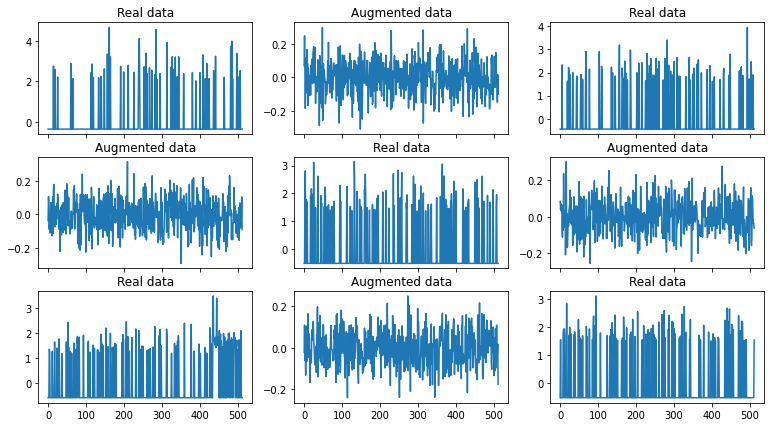

Model just saved at epoch 4.
Epoch 10: 42.910 & 0.000


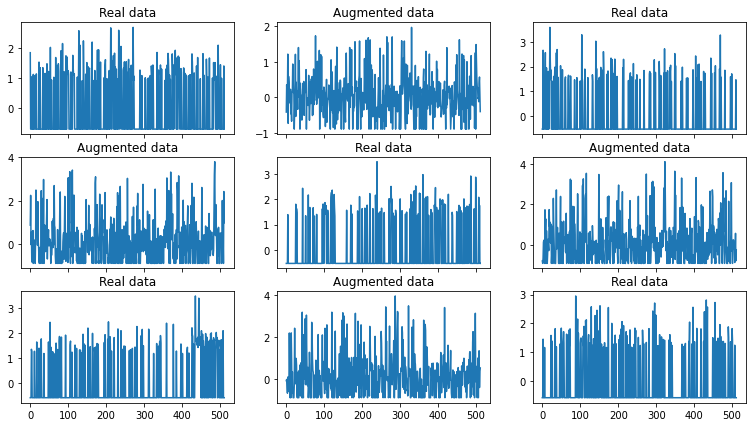

Model just saved at epoch 14.
Epoch 20: -27.296 & 0.000


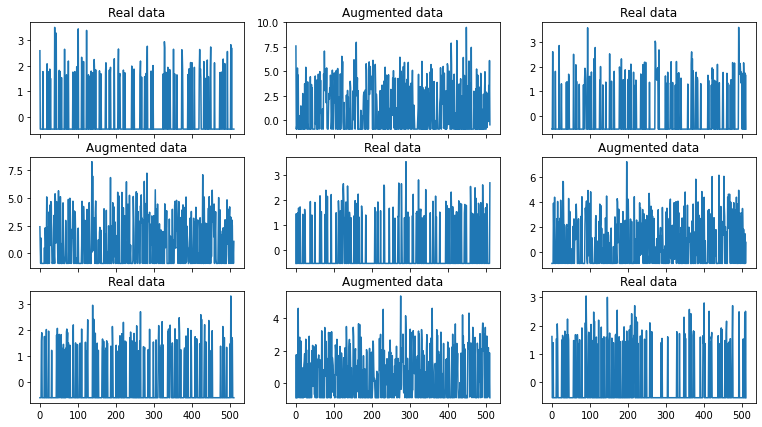

Epoch 30: 27.824 & 0.000


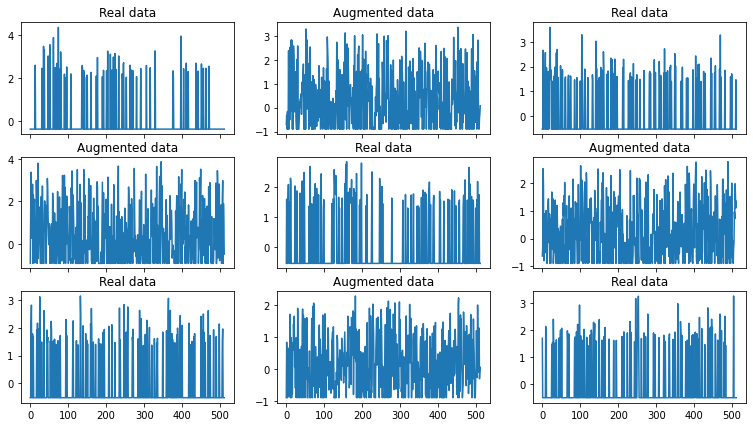

Epoch 40: -25.338 & 0.000


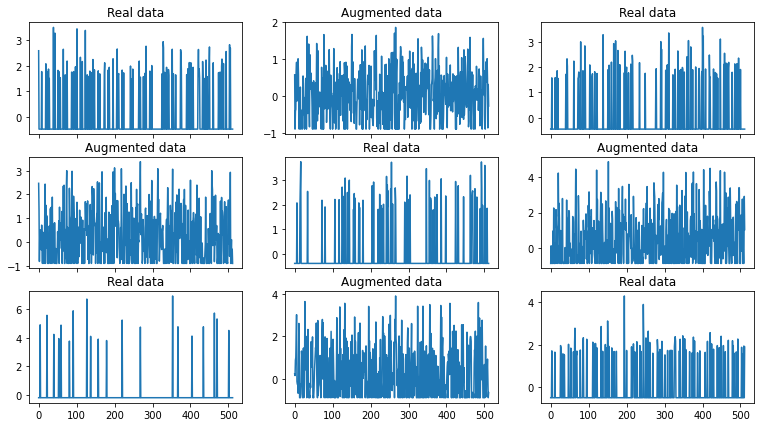

Epoch 50: -74.902 & 0.000


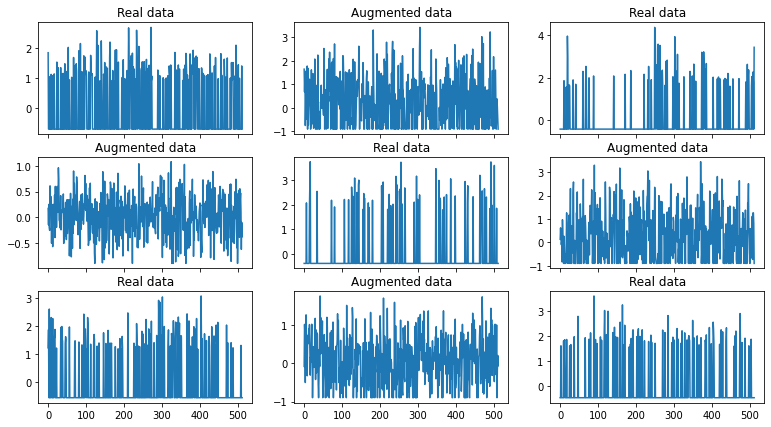

Epoch 60: -58.297 & 0.000


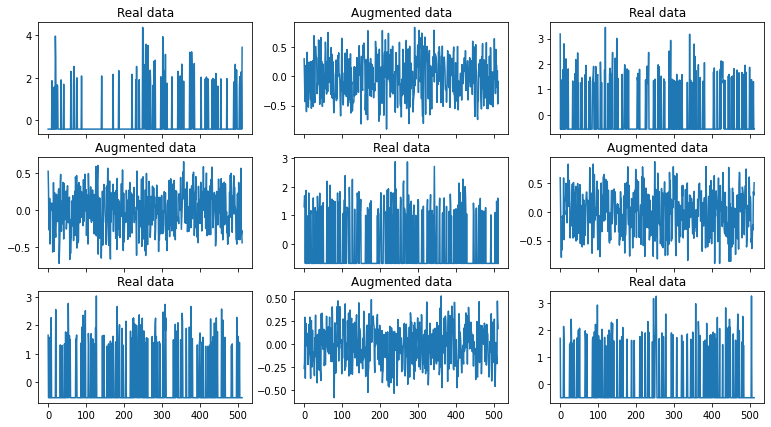

Model just saved at epoch 69.
Epoch 70: 235.770 & 0.000


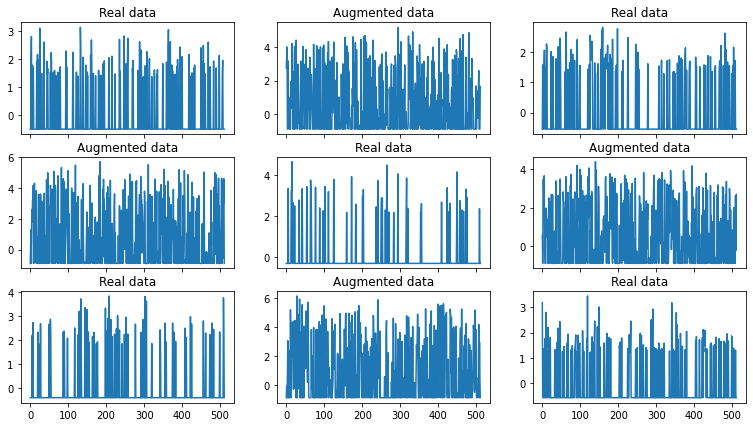

Model just saved at epoch 74.
Epoch 80: -43.750 & 0.000


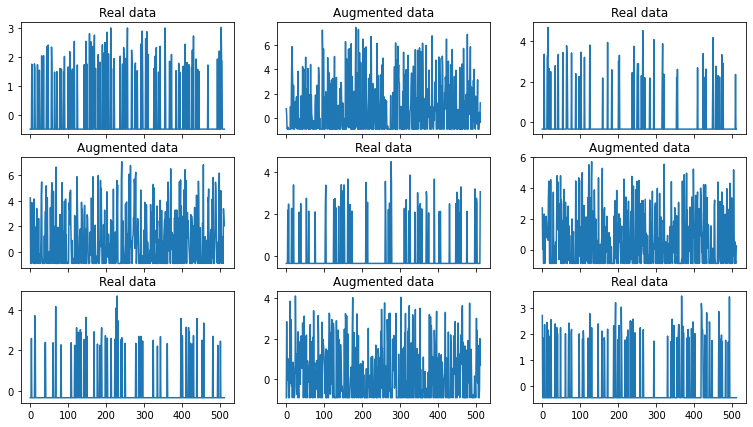

Epoch 90: -100.907 & 0.000


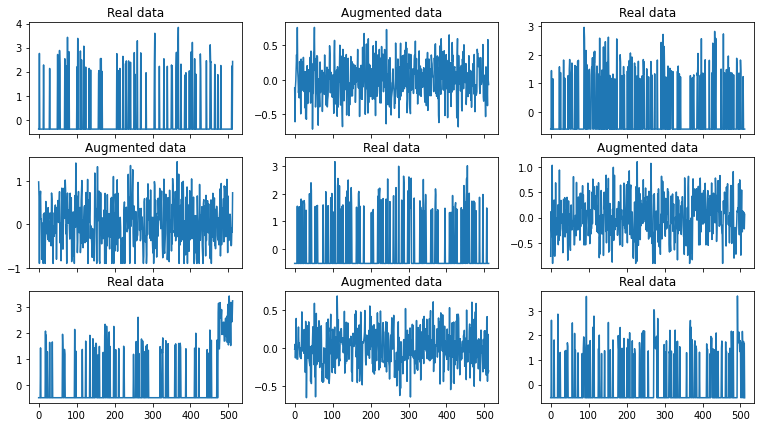

Epoch 100: -57.082 & 0.000


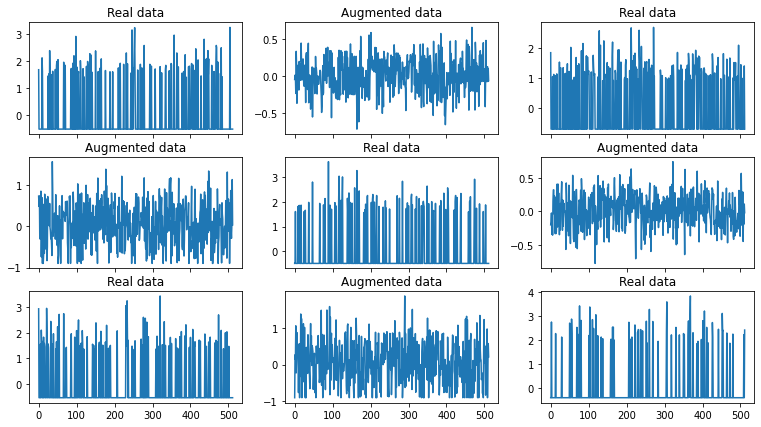

Epoch 110: -57.324 & 0.000


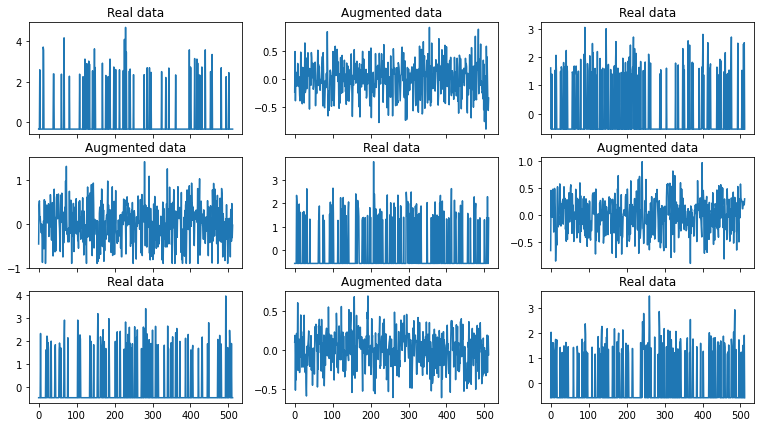

Epoch 120: 126.670 & 0.000


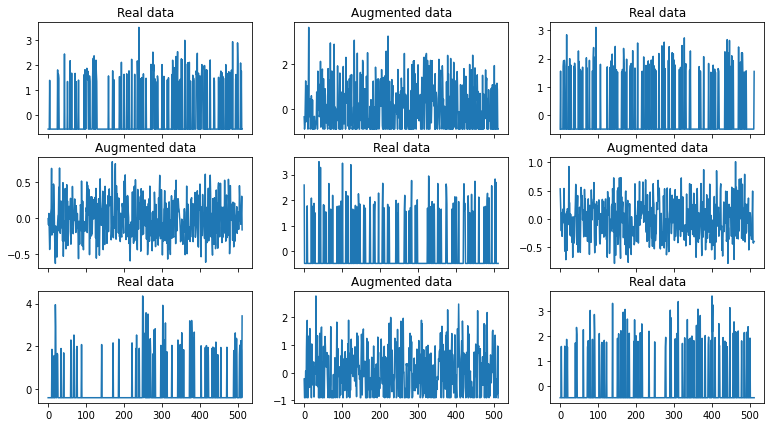

Epoch 130: -92.548 & 0.000


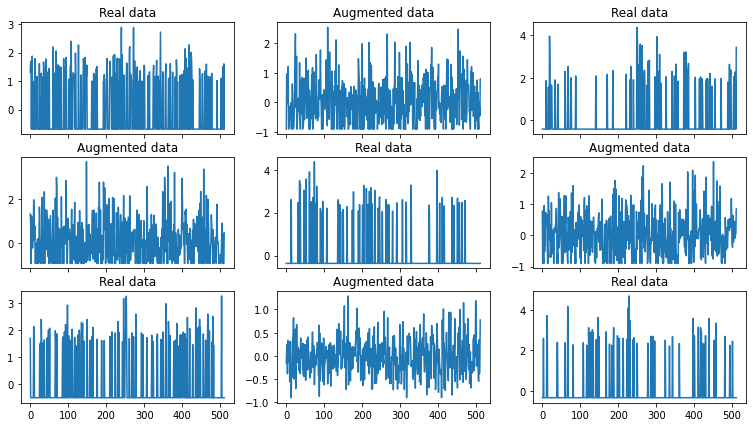

Epoch 140: 18.197 & 0.000


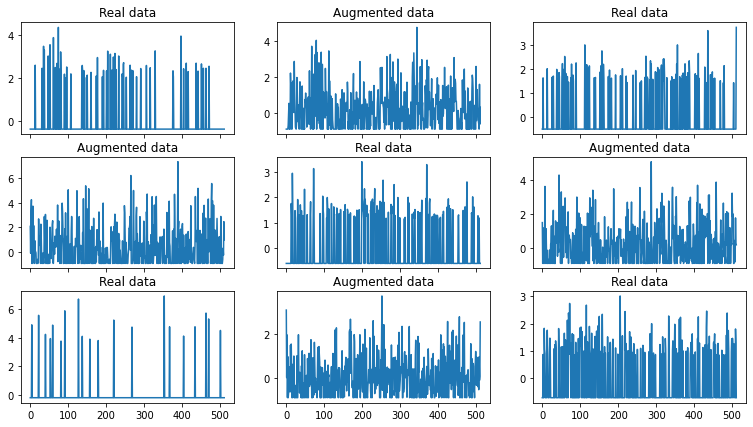

Epoch 150: -147.776 & 0.000


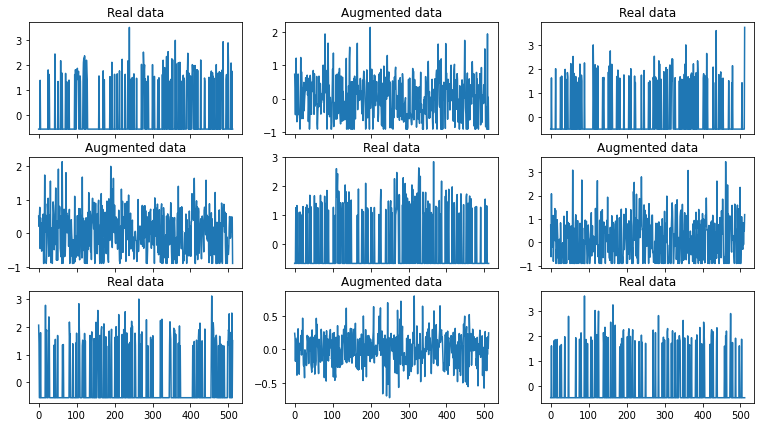

Epoch 160: -182.886 & 0.000


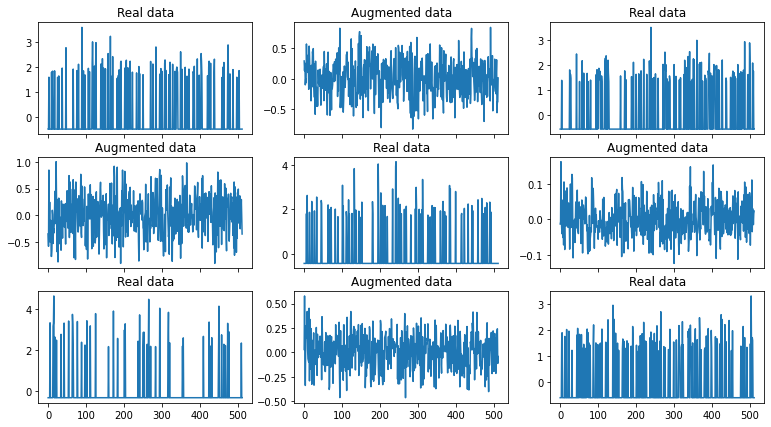

Epoch 170: -222.413 & 0.000


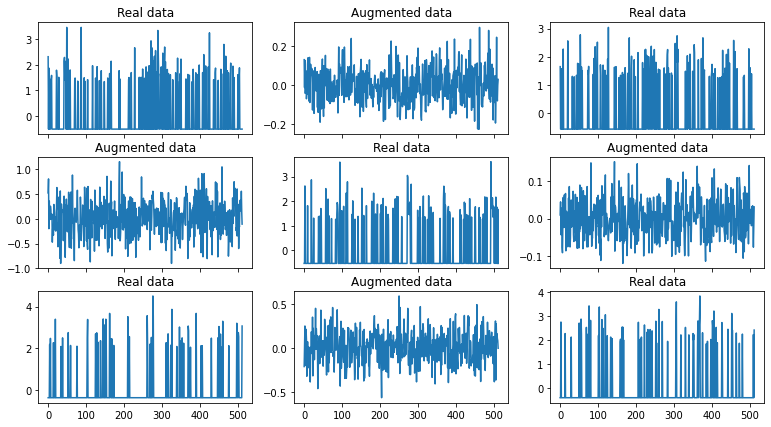

Epoch 180: 516.920 & 0.000


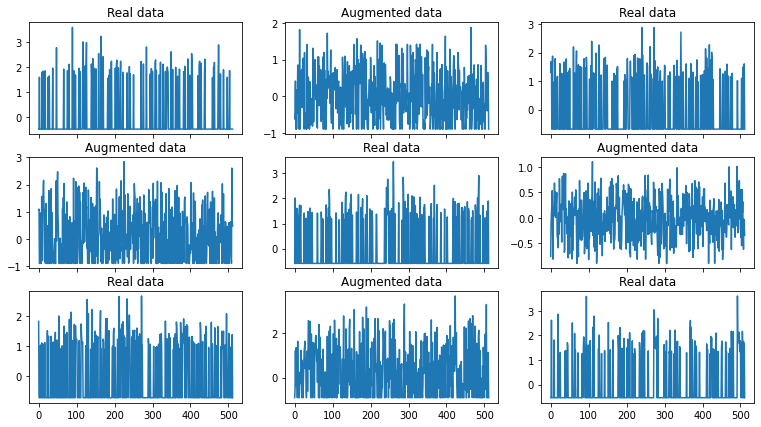

Epoch 190: -264.717 & 0.000


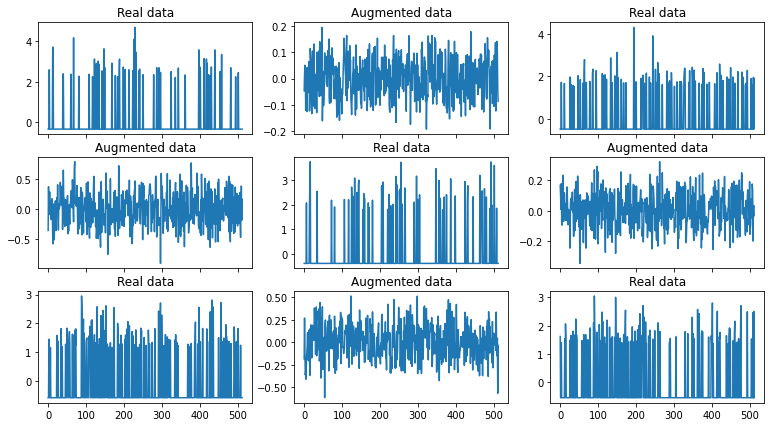

Epoch 200: -203.001 & 0.000


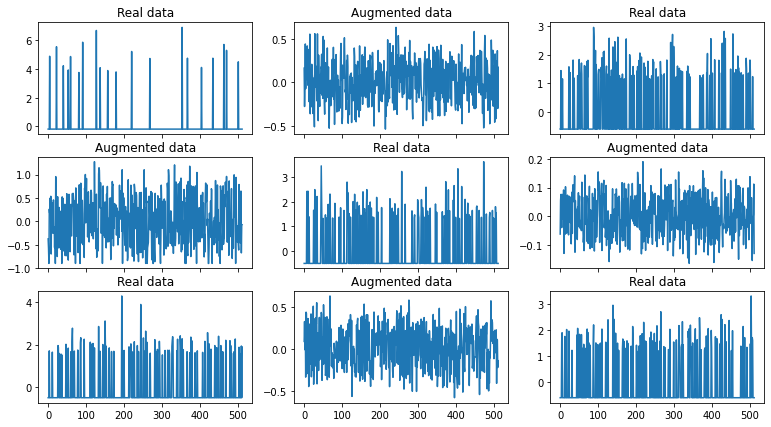

Epoch 210: -277.421 & 0.000


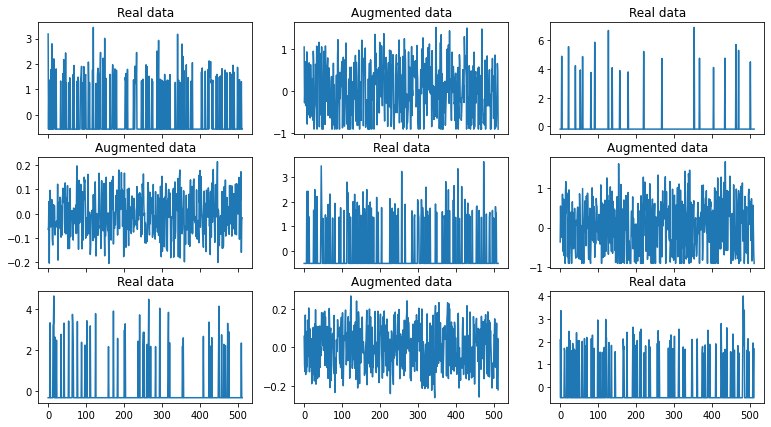

Epoch 220: -555.797 & 0.000


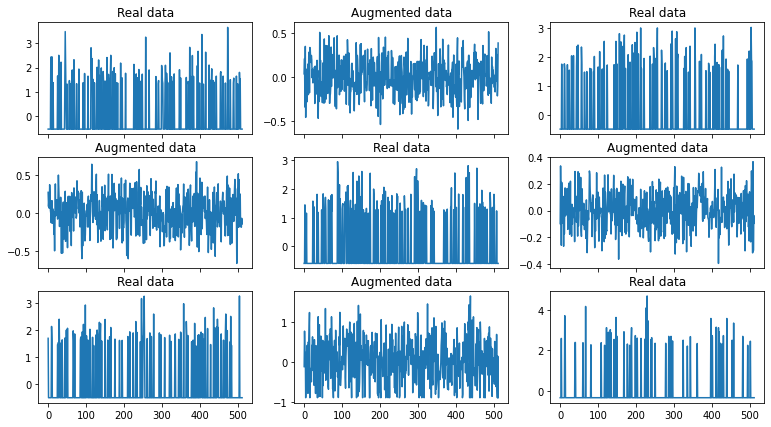

Epoch 230: -381.142 & 0.000


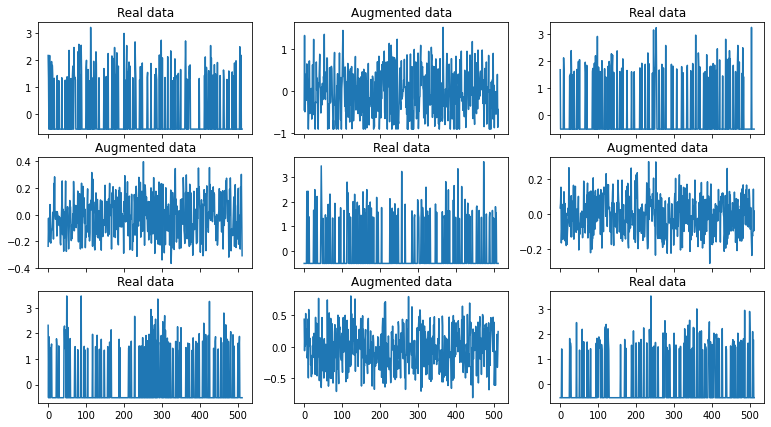

Model just saved at epoch 234.
Epoch 240: -663.799 & 0.000


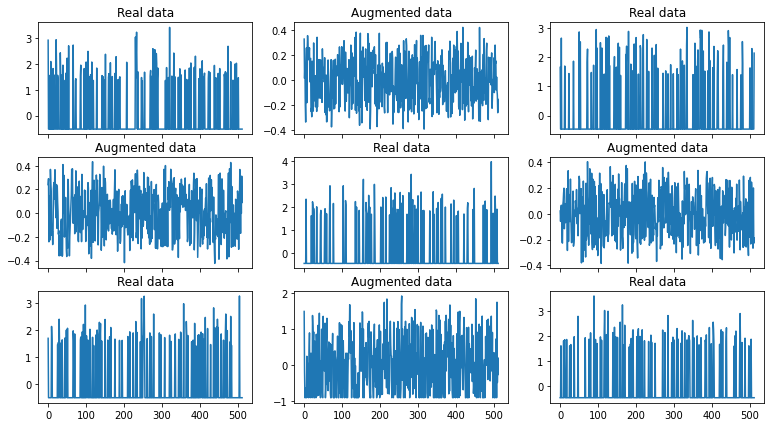

Epoch 250: -687.725 & 0.000


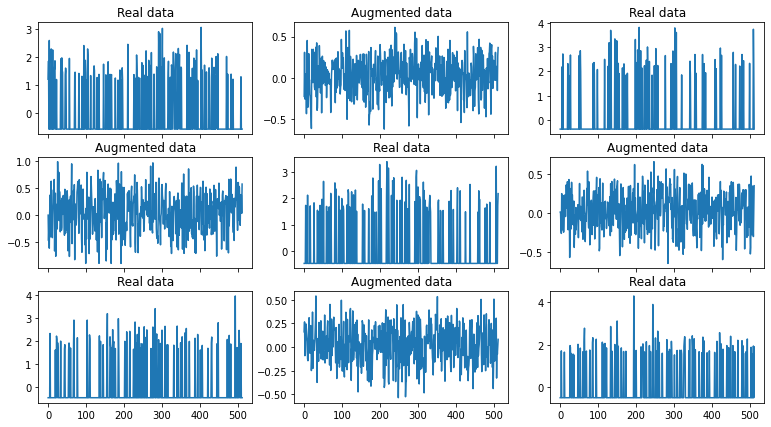

Epoch 260: -930.381 & 0.000


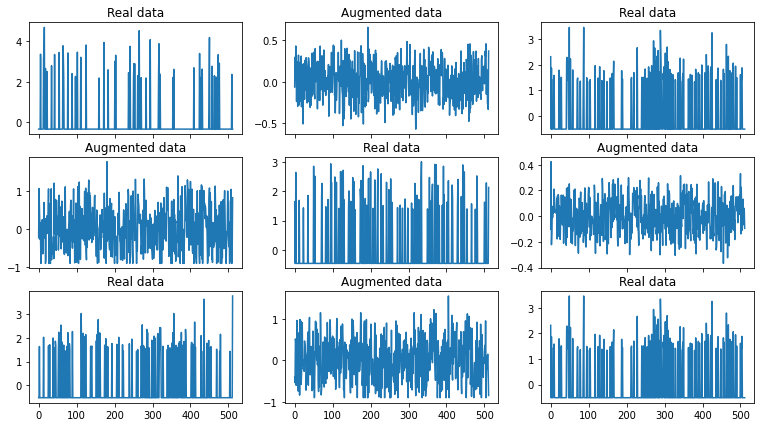

Epoch 270: -1226.151 & 0.000


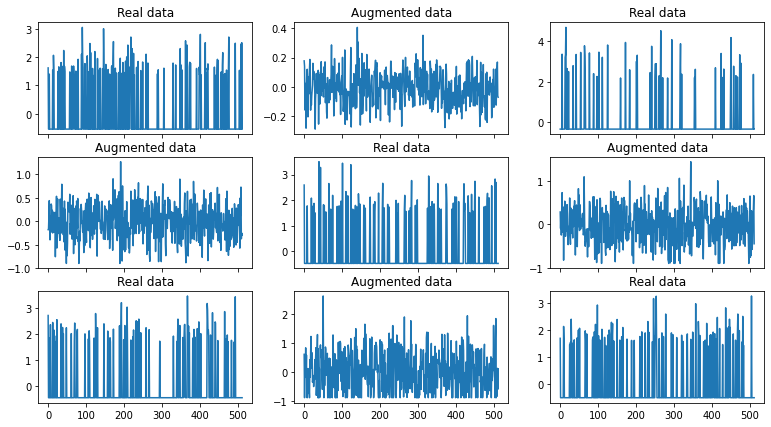

Epoch 280: 553.258 & 0.000


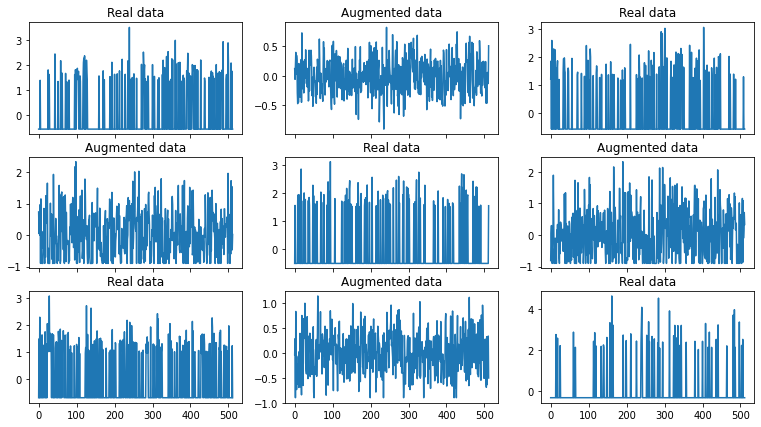

Epoch 290: -1116.318 & 0.000


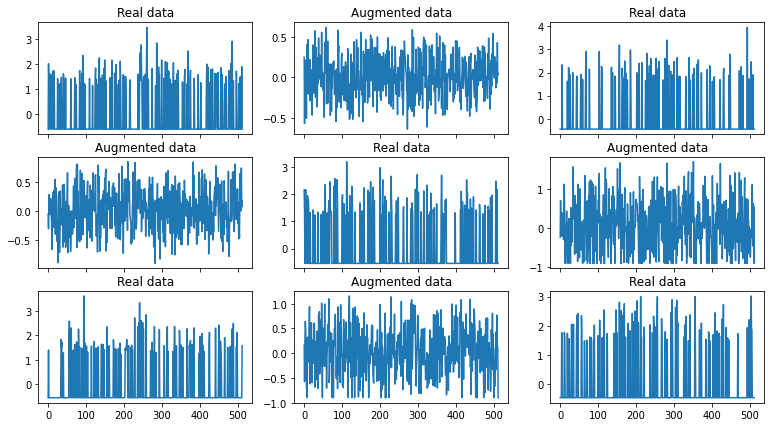

Epoch 300: -1130.933 & 0.000


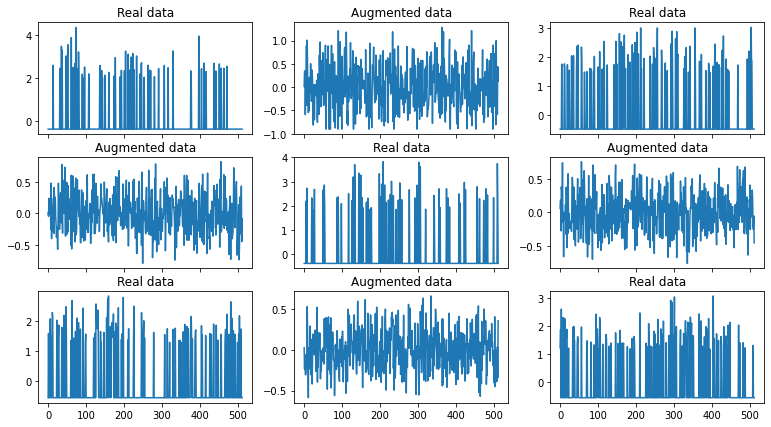

Epoch 310: -336.407 & 0.000


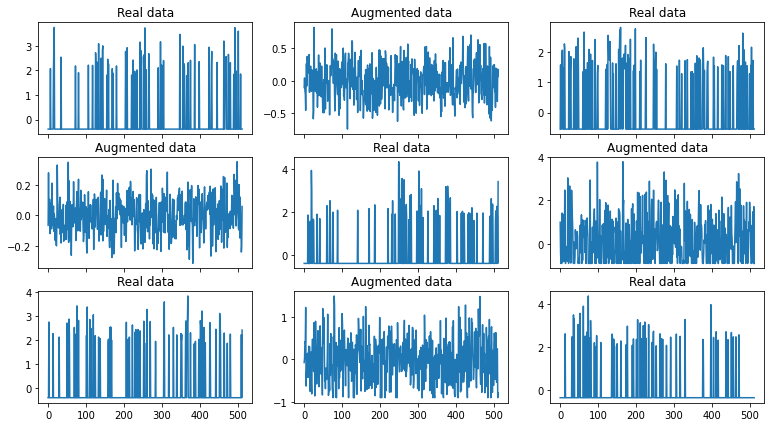

Model just saved at epoch 314.
Epoch 320: -2838.455 & 0.000


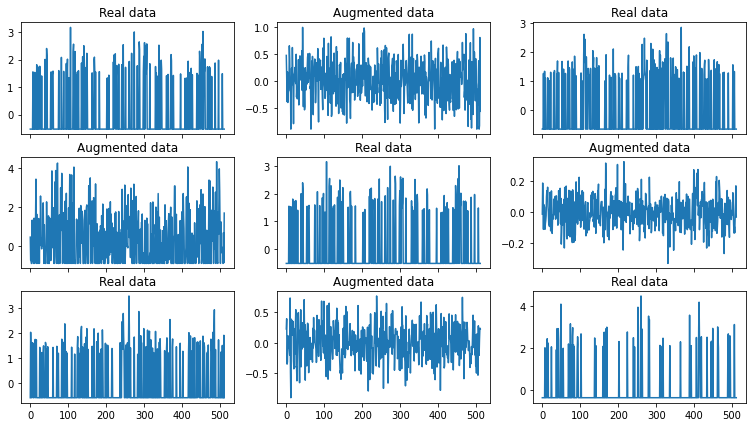

Epoch 330: -4208.450 & 0.000


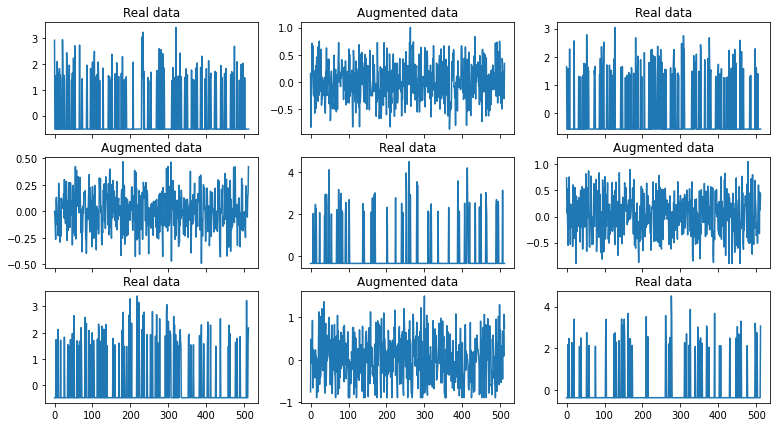

Epoch 340: -4176.663 & 0.000


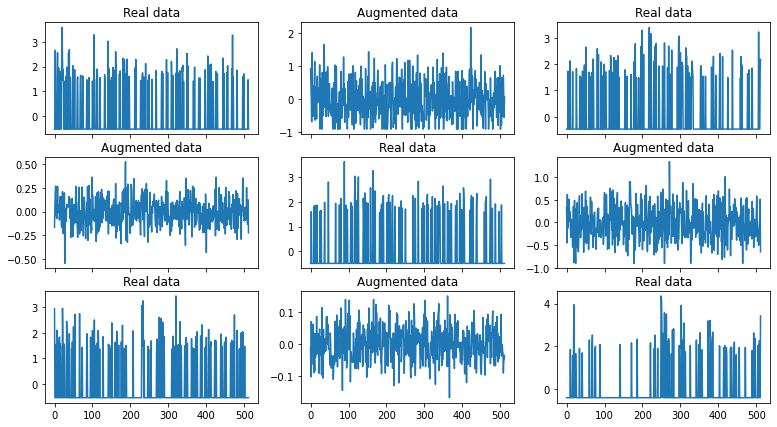

Epoch 350: -3228.282 & 0.000


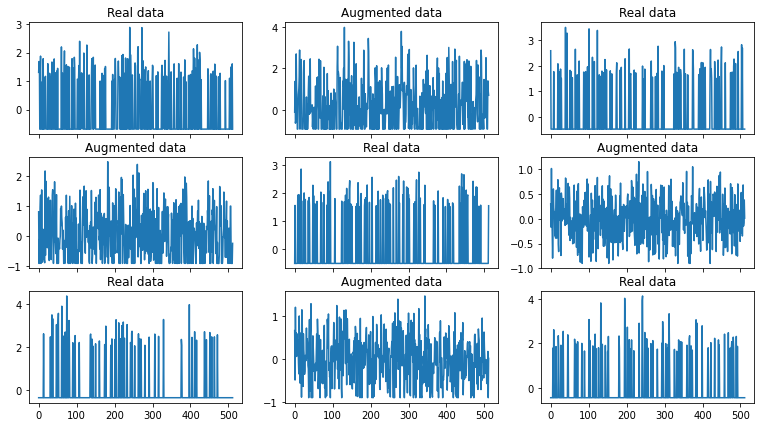

Model just saved at epoch 354.
Epoch 360: -5543.802 & 0.000


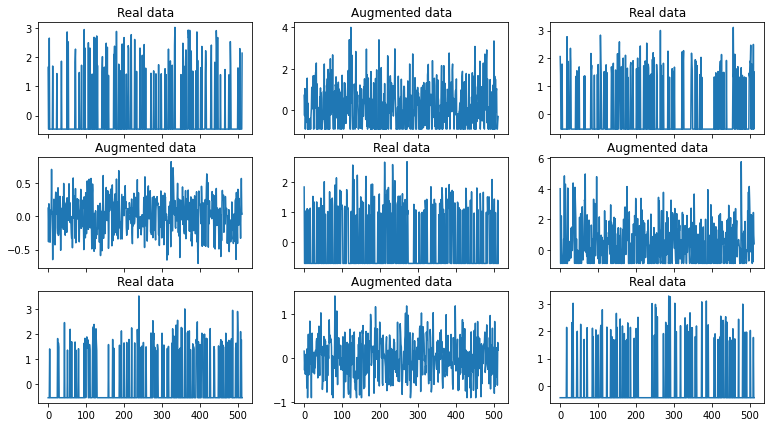

Epoch 370: -5622.812 & 0.000


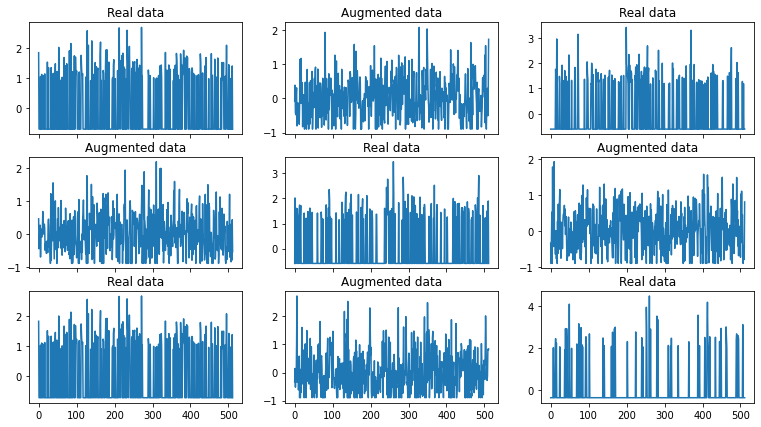

Model just saved at epoch 379.
Epoch 380: 20413.154 & 0.000


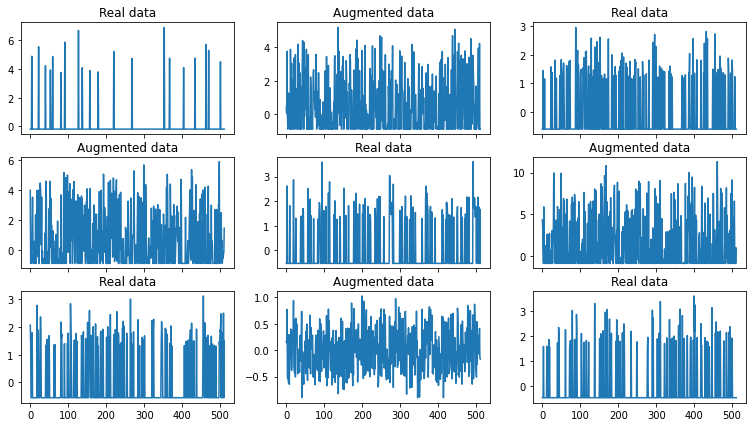

Epoch 390: -5921.605 & 0.000


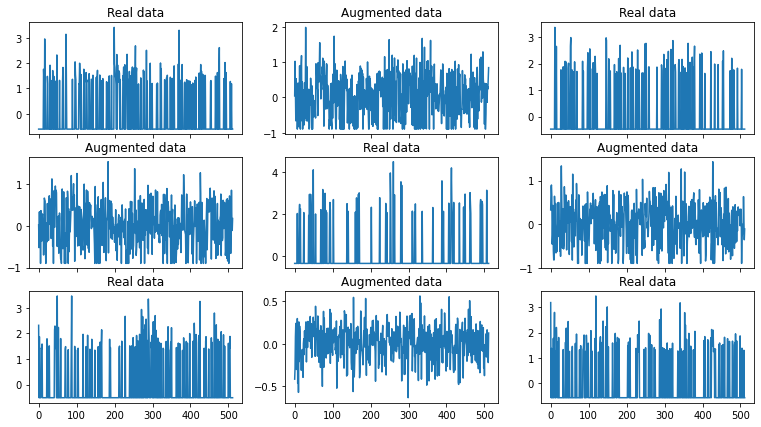

Epoch 400: -2288.507 & 0.000


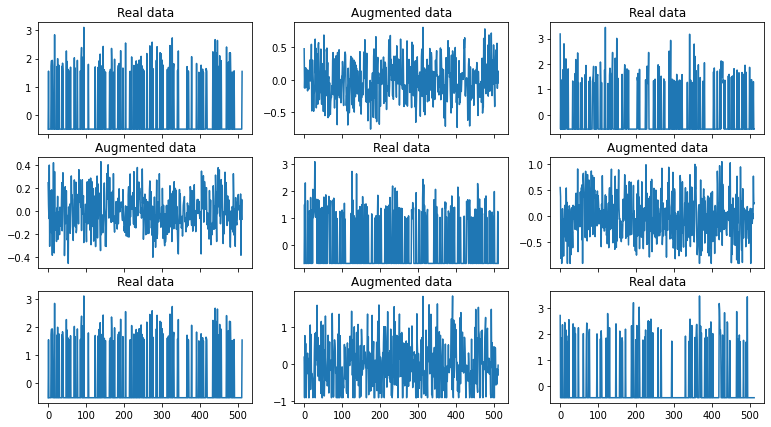

Epoch 410: 4890.084 & 0.000


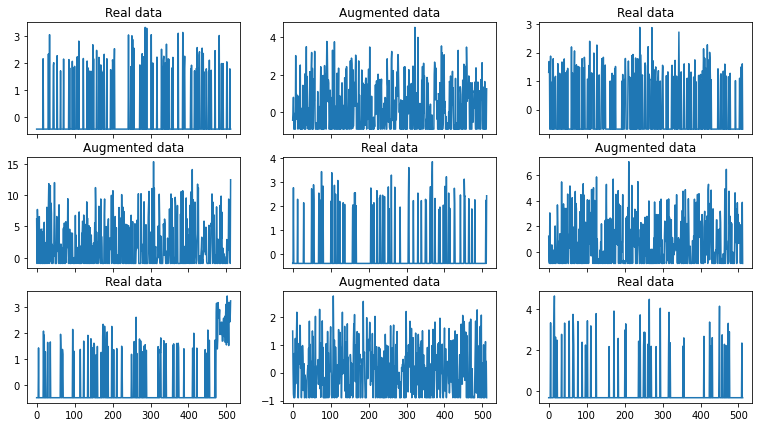

Model just saved at epoch 414.
Epoch 420: -5363.617 & 0.000


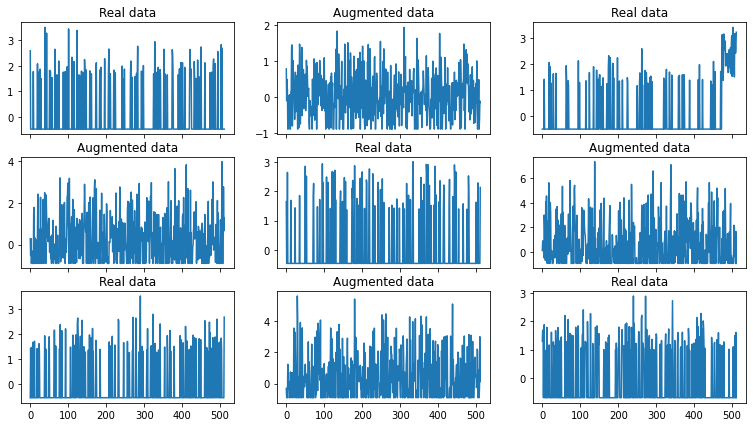

Epoch 430: -9405.688 & 0.000


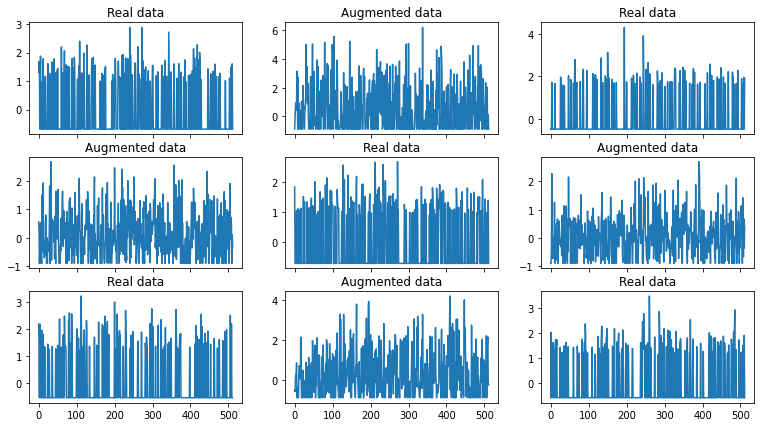

Epoch 440: -9944.038 & 0.000


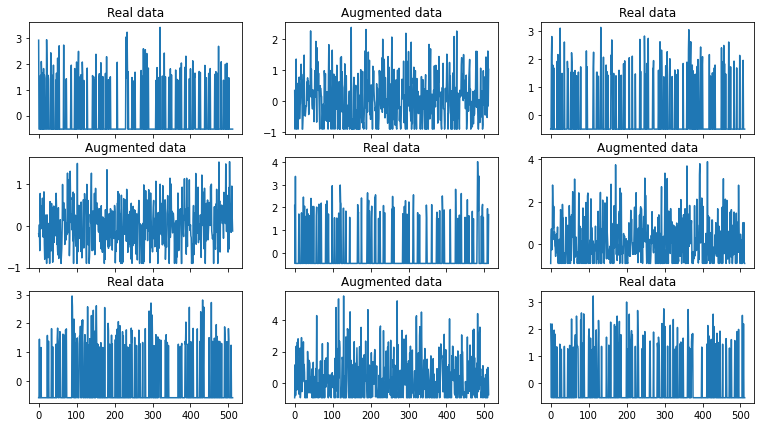

Epoch 450: 134.369 & 0.000


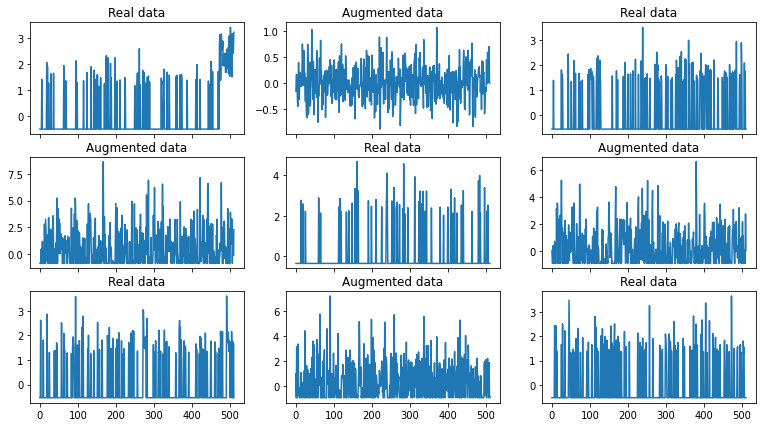

Model just saved at epoch 454.
Epoch 460: 1879.606 & 0.000


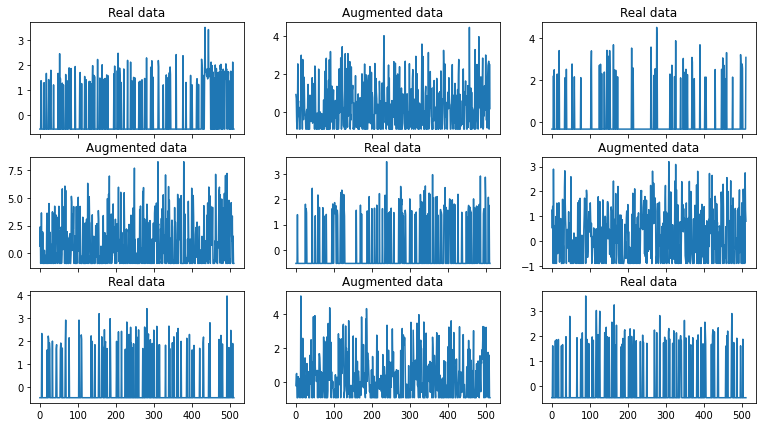

Epoch 470: -10002.983 & 0.000


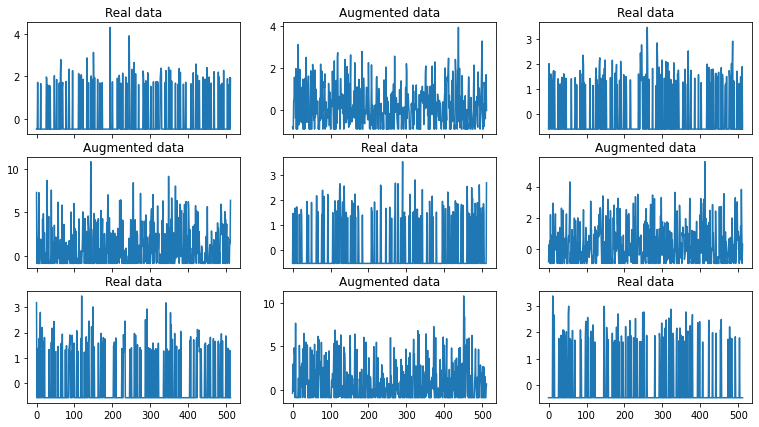

Epoch 480: -10757.905 & 0.000


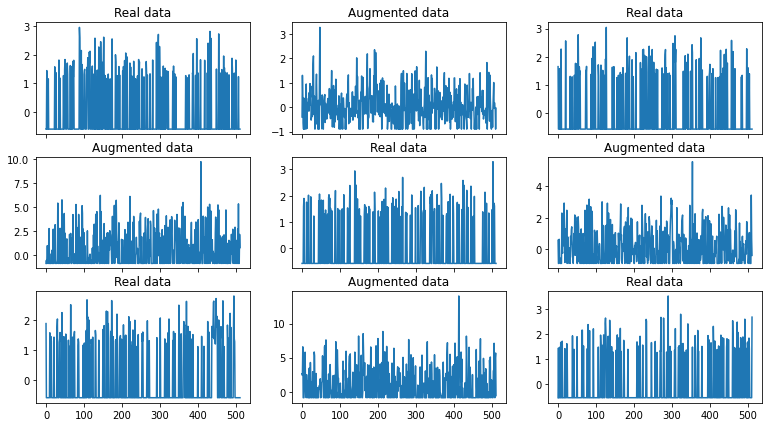

Epoch 490: -9805.165 & 0.000


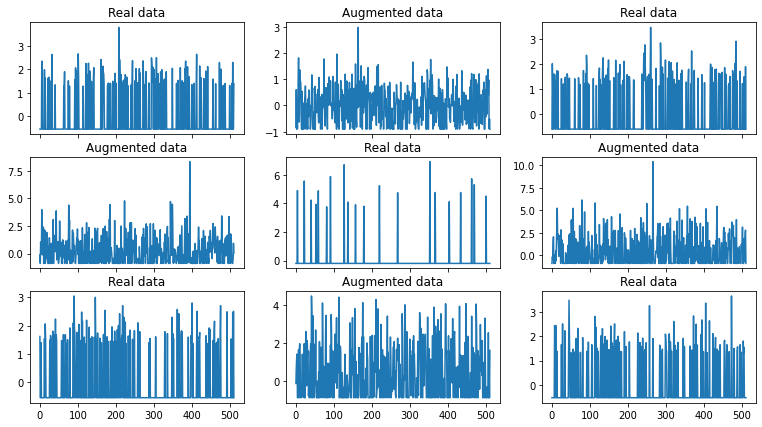

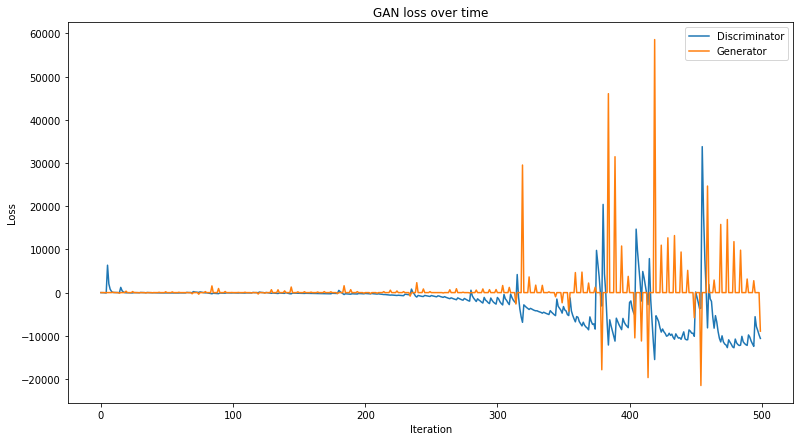

In [15]:
augmenter1 = DataAugmenter(trainLabel1X)
augmenter1.trainModel(epochs=500, criticGeneratorTrainRatio=5, gradClipVal=1, batchSize=64, lrD=0.001, lrG=0.001, savedModelName='Class 1 Augmenter')
augmenter1.plotLossOverTime()

Epoch 0: -42.740 & 0.000


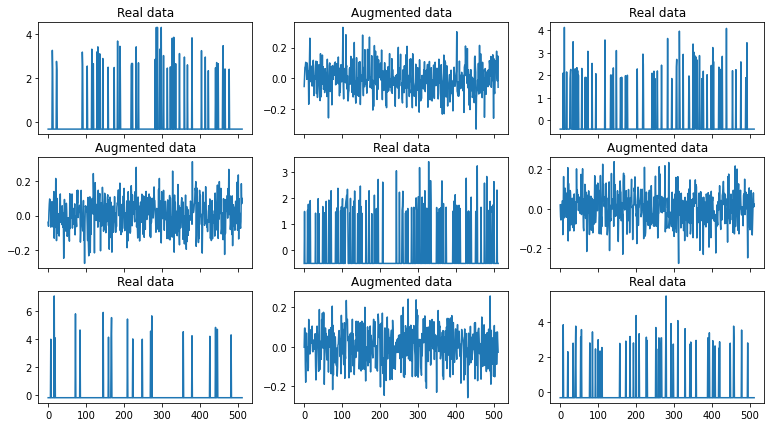

Model just saved at epoch 4.
Model just saved at epoch 4.
Model just saved at epoch 4.
Model just saved at epoch 4.
Epoch 10: -100412.013 & 0.000


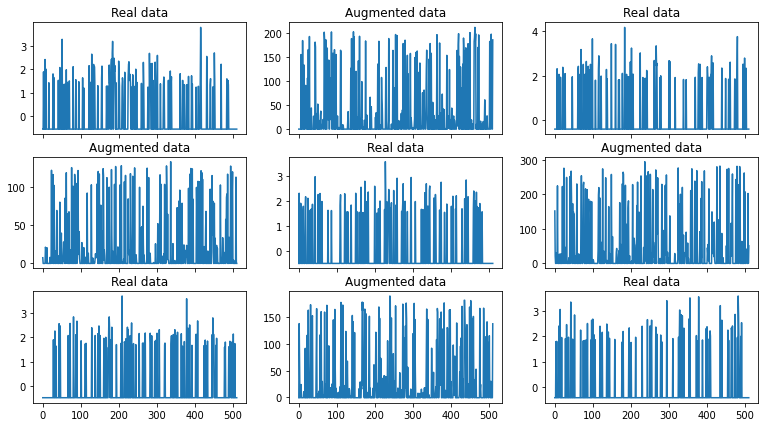

Epoch 20: 70716.724 & 0.000


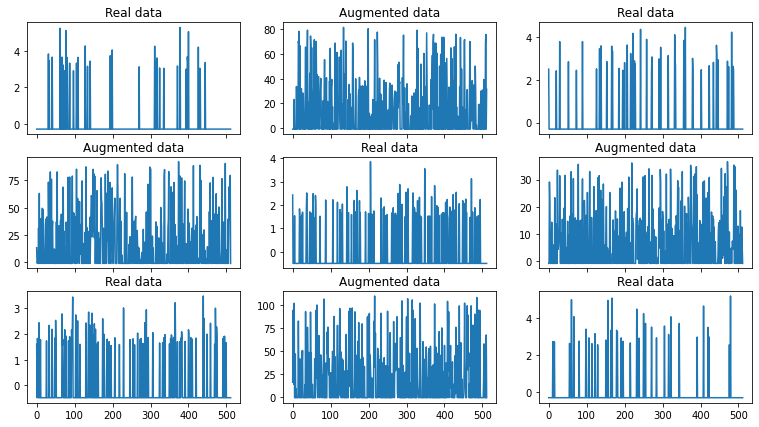

Epoch 30: -13618.887 & 0.000


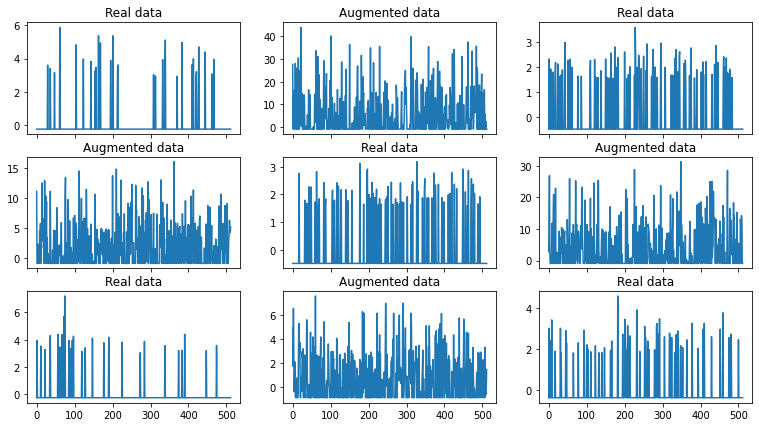

Epoch 40: 2038.425 & 0.000


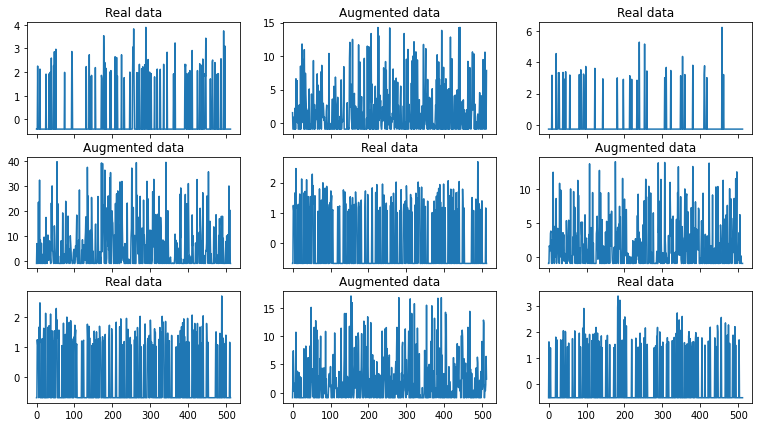

Epoch 50: 1688.389 & 0.000


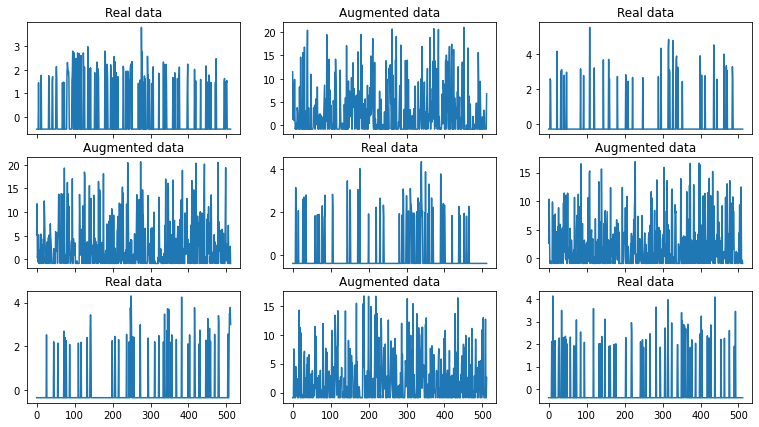

Epoch 60: 1572.488 & 0.000


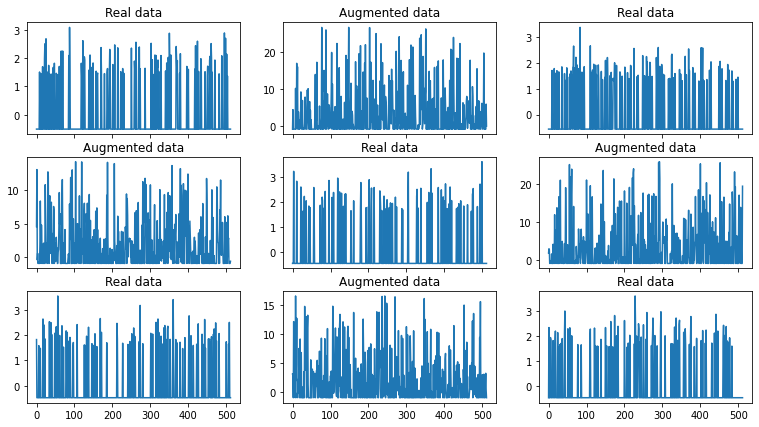

Epoch 70: 1352.425 & 0.000


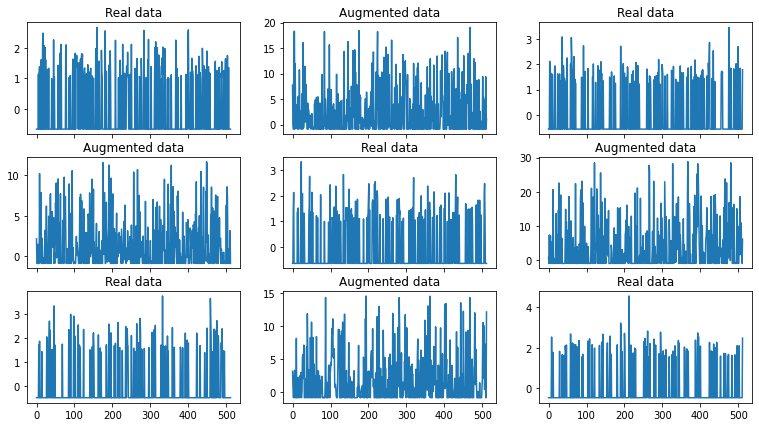

Epoch 80: 1157.581 & 0.000


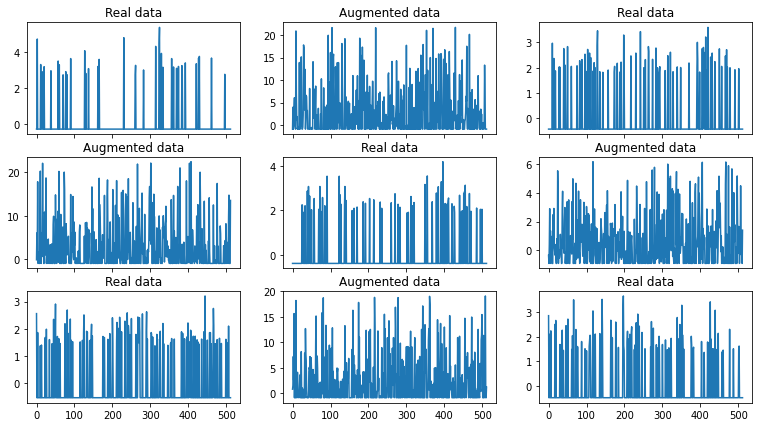

Epoch 90: 804.120 & 0.000


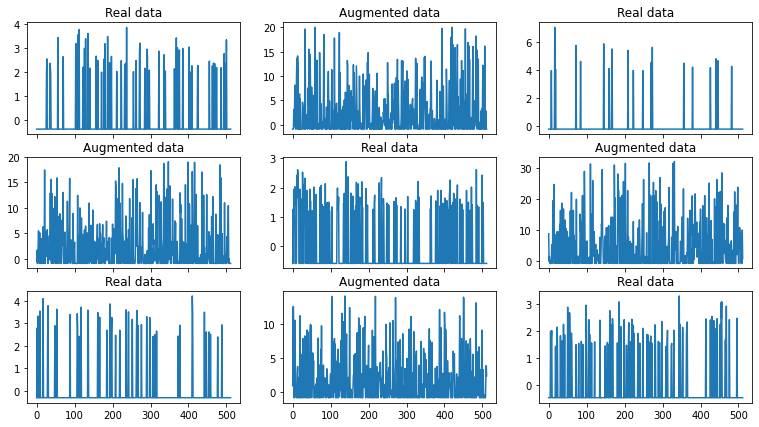

Epoch 100: 586.563 & 0.000


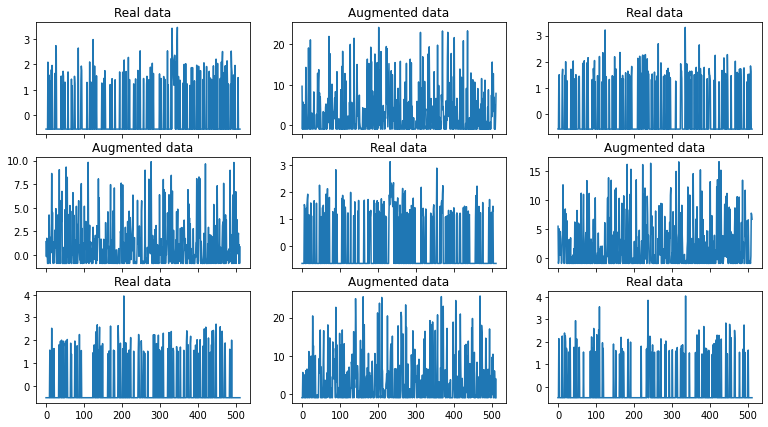

Epoch 110: -115247.611 & 0.000


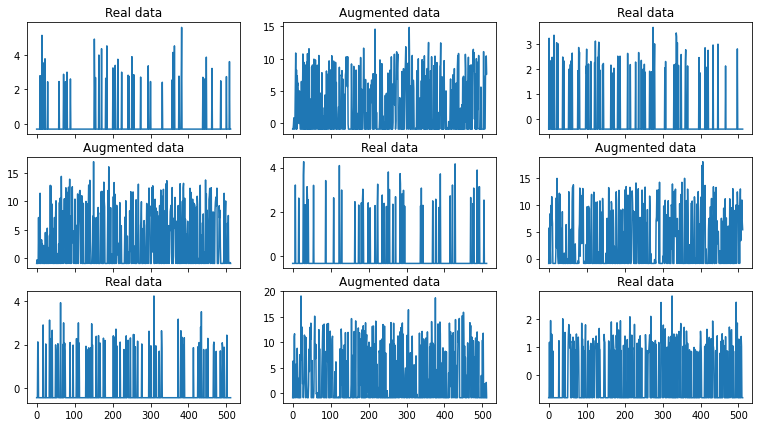

Epoch 120: -61839.779 & 0.000


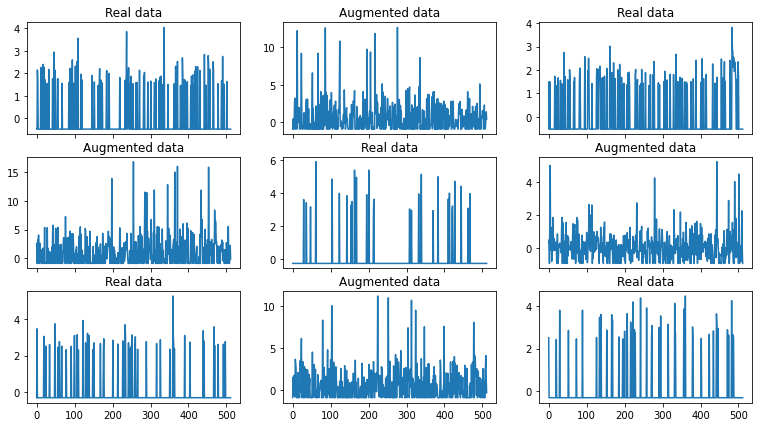

Epoch 130: -126051.719 & 0.000


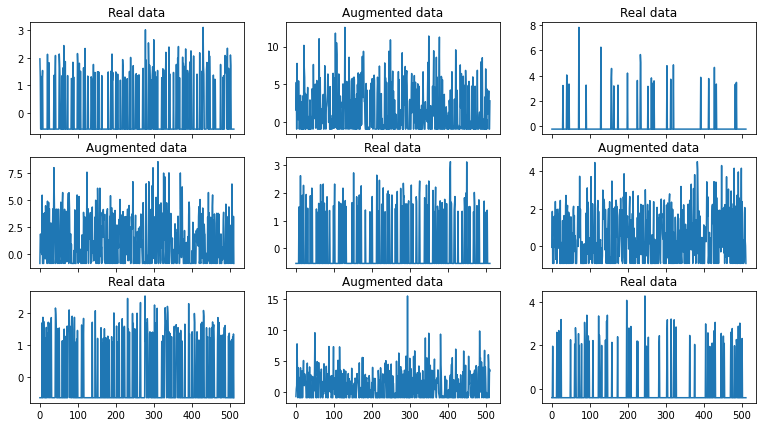

Epoch 140: -25756.427 & 0.000


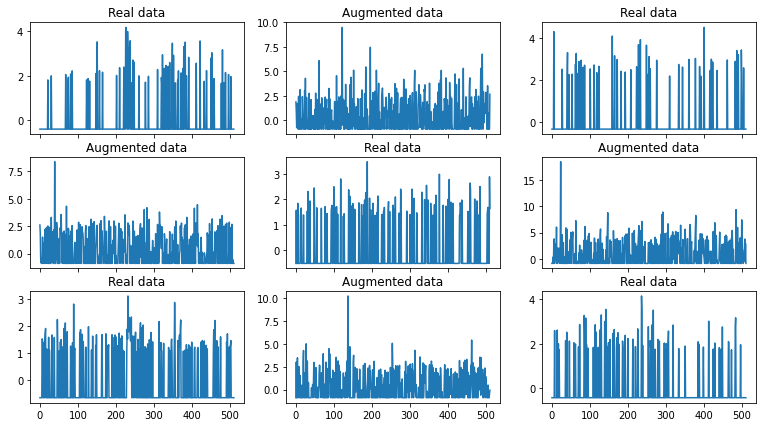

Epoch 150: -30981.670 & 0.000


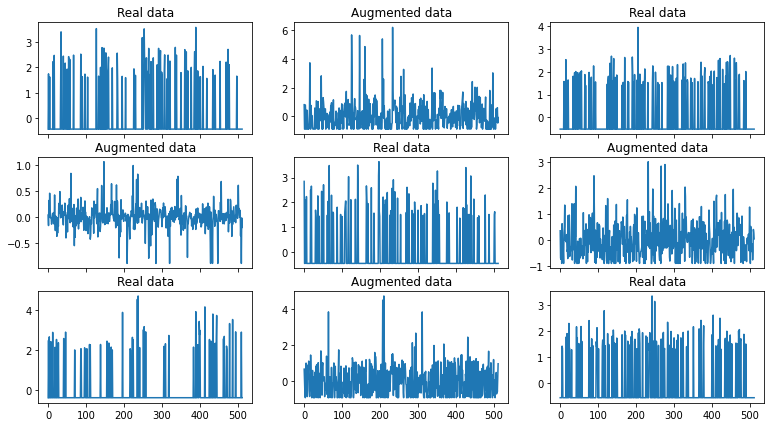

Epoch 160: -84735.814 & 0.000


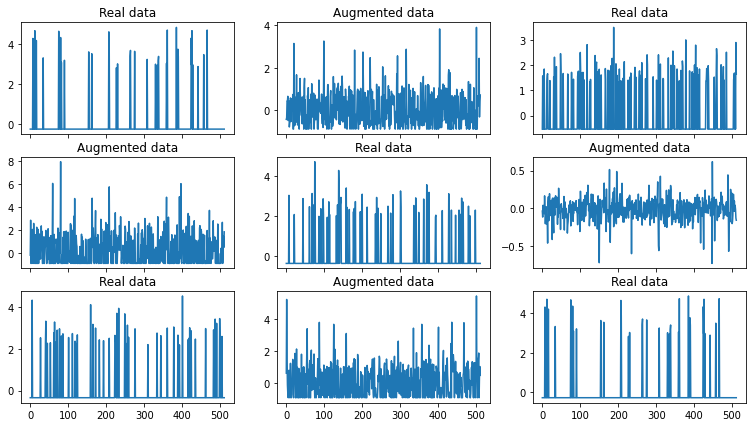

Epoch 170: -23472.367 & 0.000


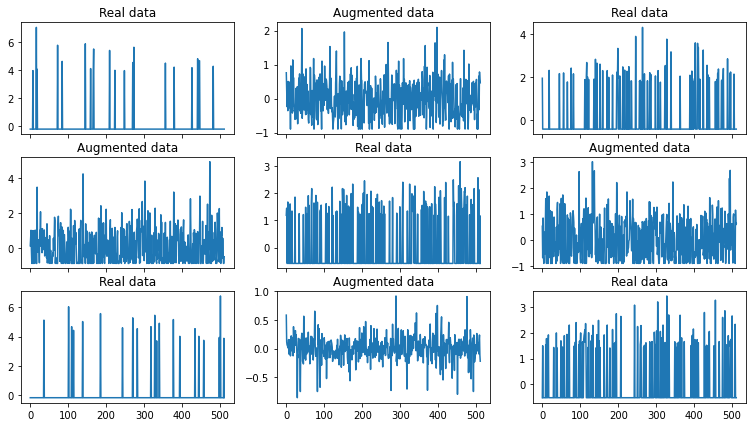

Epoch 180: -75545.358 & 0.000


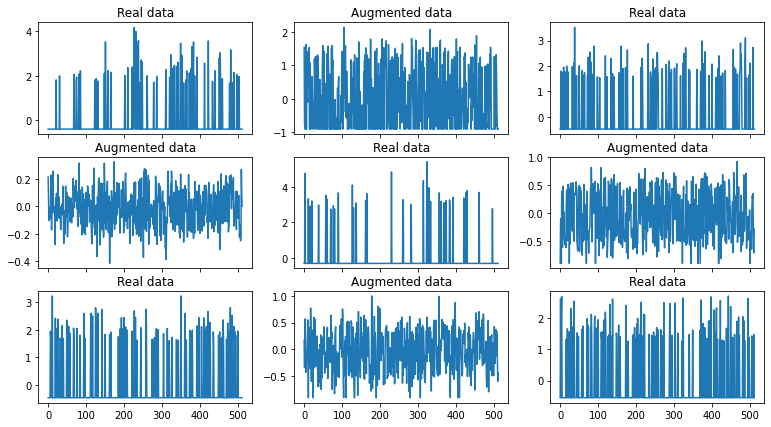

Epoch 190: -46441.332 & 0.000


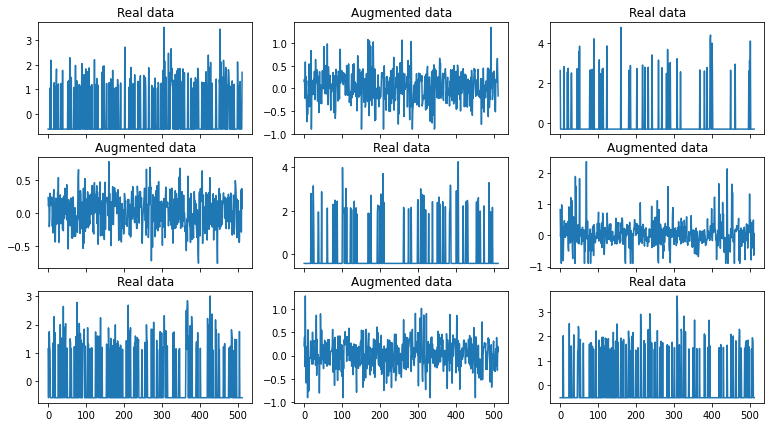

Epoch 200: -177019.477 & 0.000


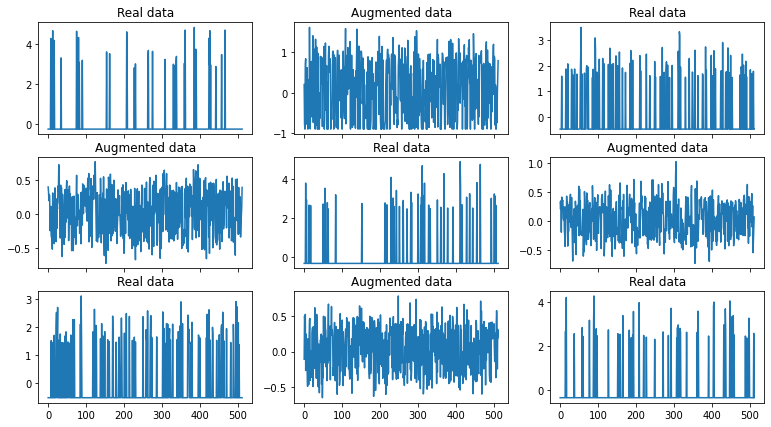

Epoch 210: -105002.260 & 0.000


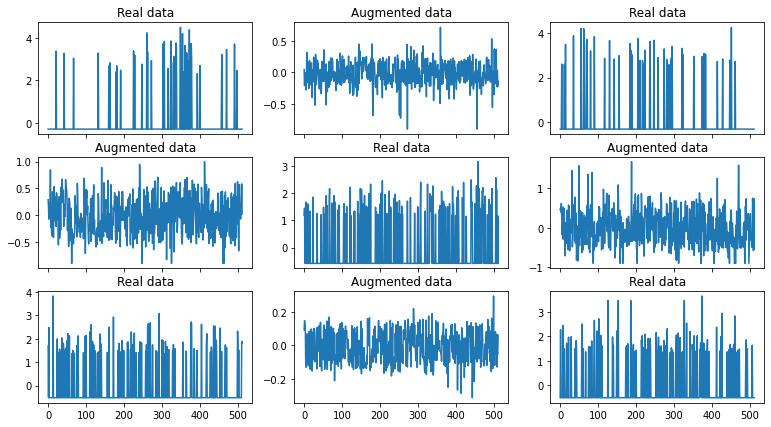

Epoch 220: -39043.755 & 0.000


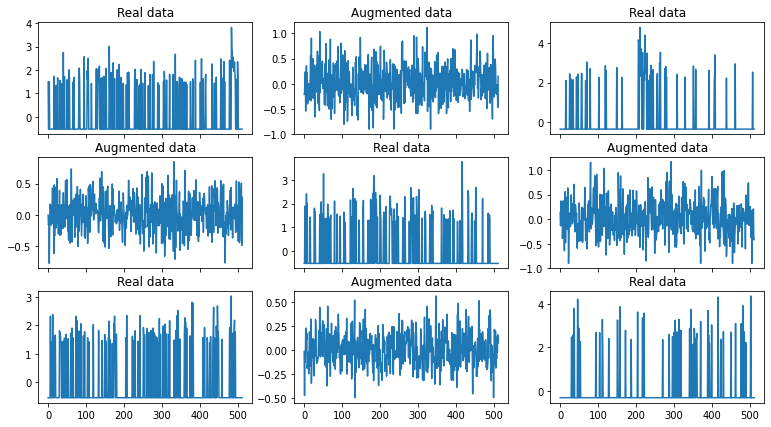

Epoch 230: -136307.492 & 0.000


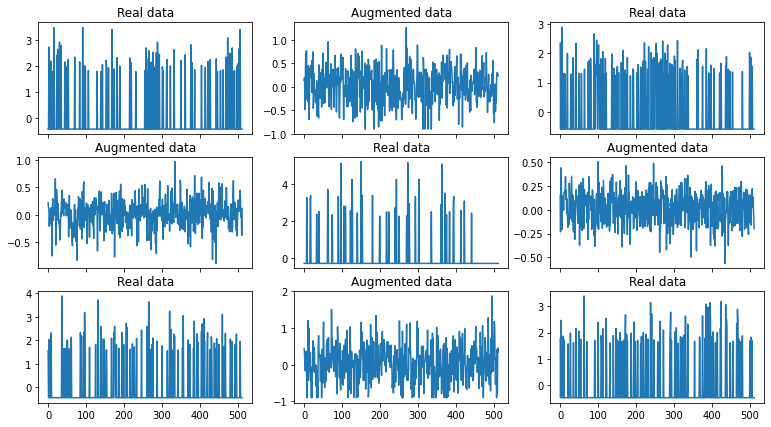

Epoch 240: -27092.734 & 0.000


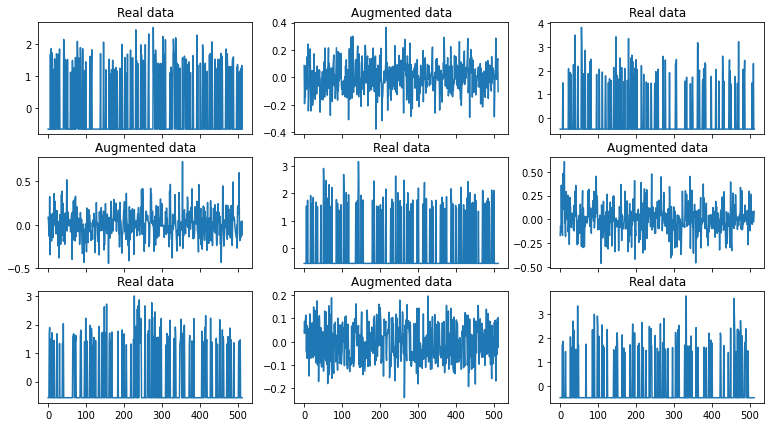

Epoch 250: -93791.226 & 0.000


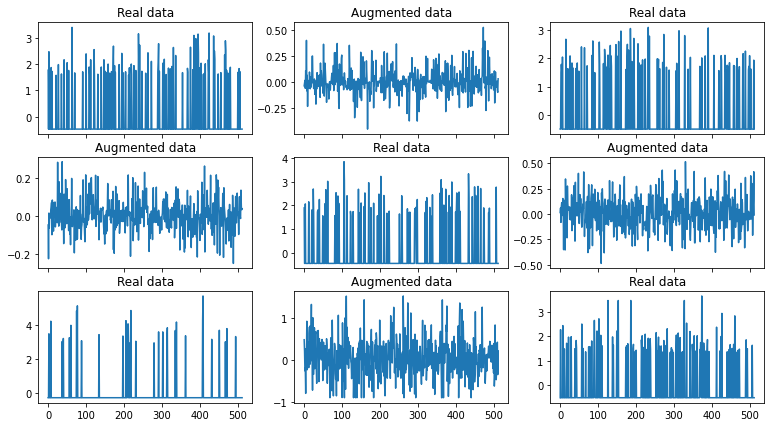

Epoch 260: -64533.021 & 0.000


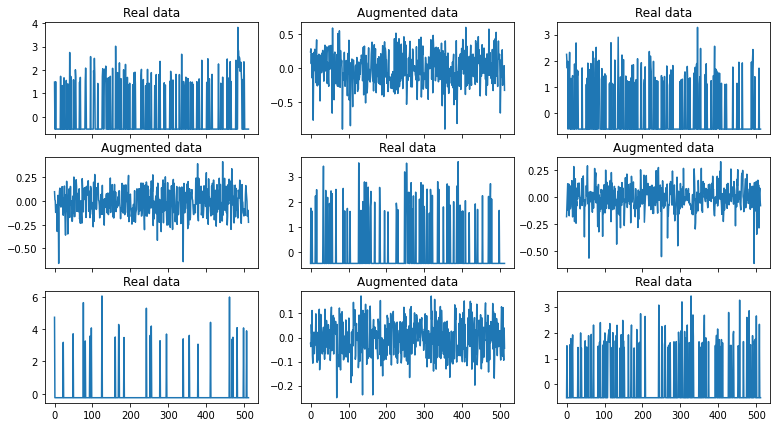

Epoch 270: -137234.910 & 0.000


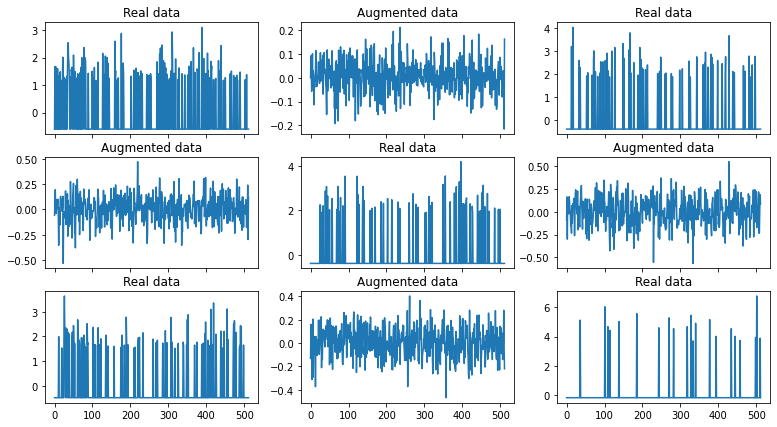

Epoch 280: -72546.985 & 0.000


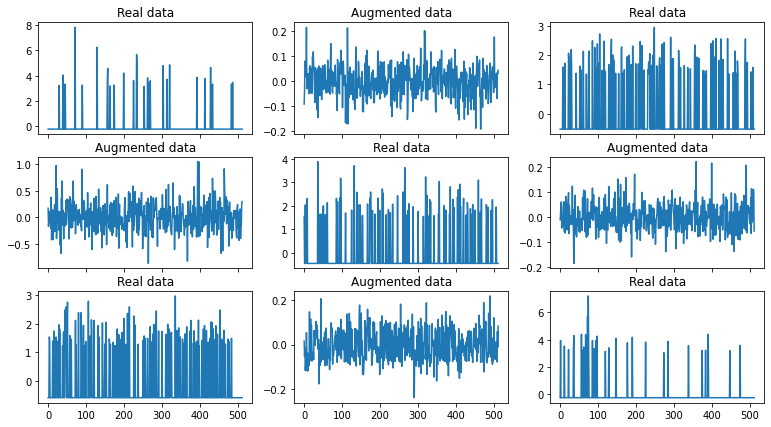

Epoch 290: -182060.426 & 0.000


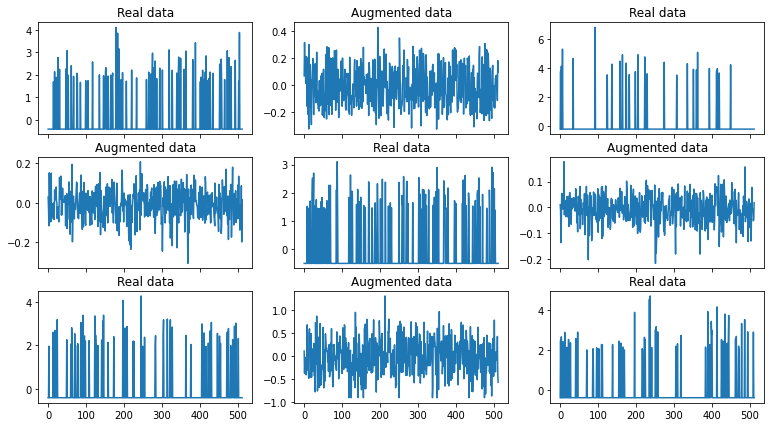

Epoch 300: -158757.602 & 0.000


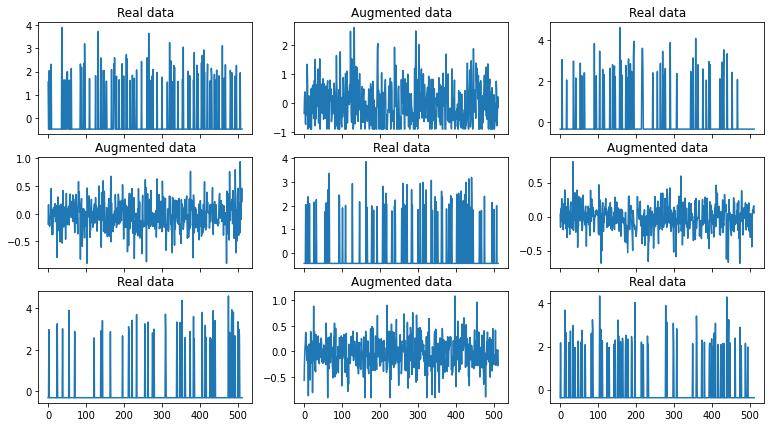

Epoch 310: -208191.785 & 0.000


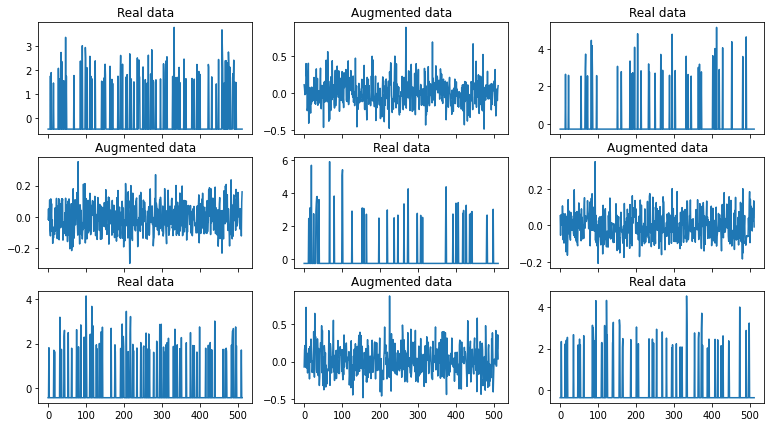

Epoch 320: -122698.654 & 0.000


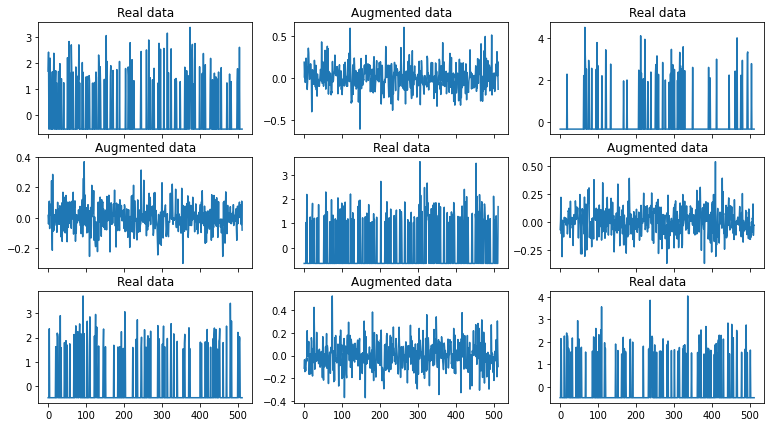

Epoch 330: -262705.207 & 0.000


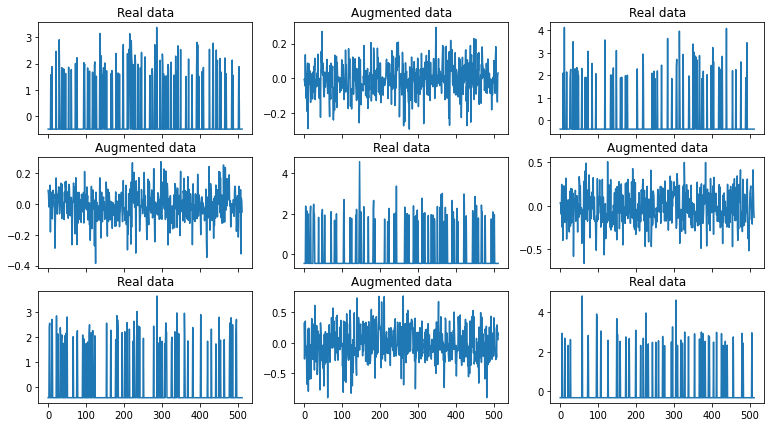

Epoch 340: -324730.062 & 0.000


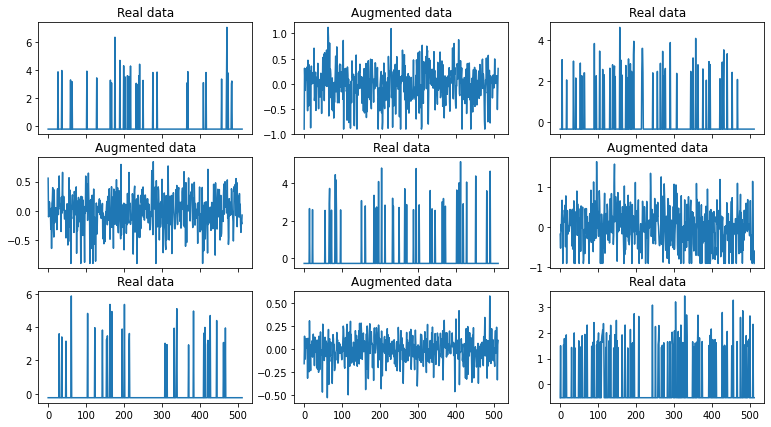

Epoch 350: -235178.789 & 0.000


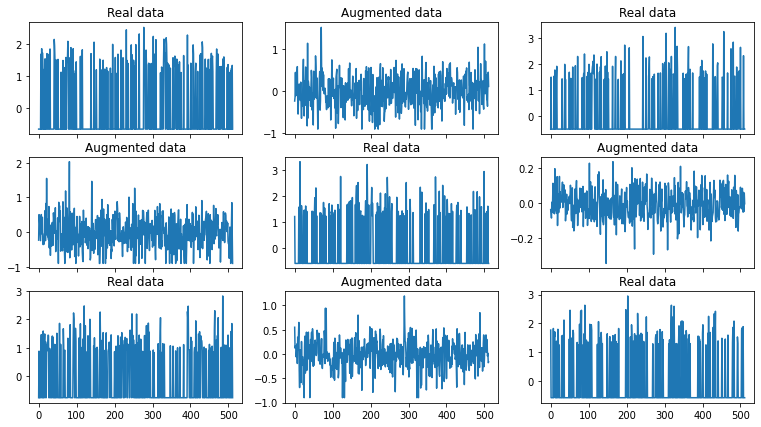

Epoch 360: -177007.109 & 0.000


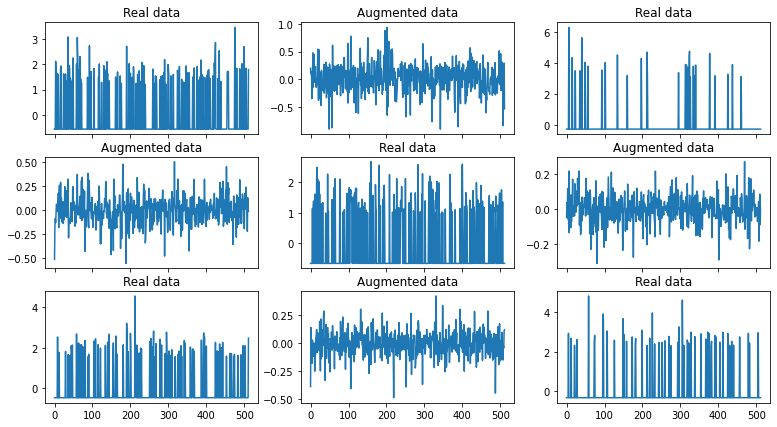

Epoch 370: -169525.398 & 0.000


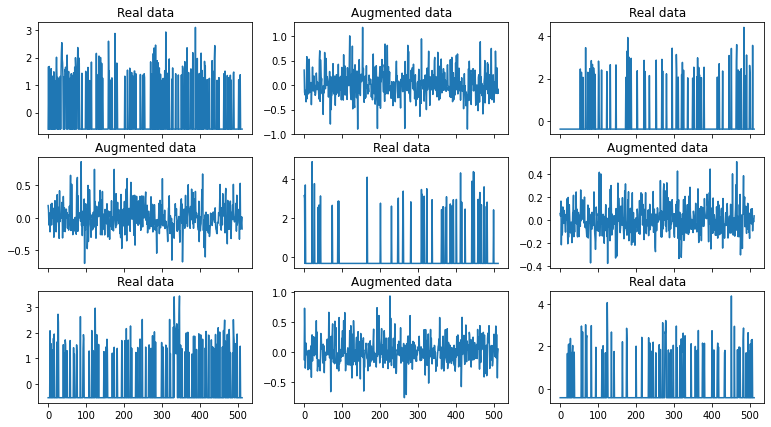

Epoch 380: -134714.479 & 0.000


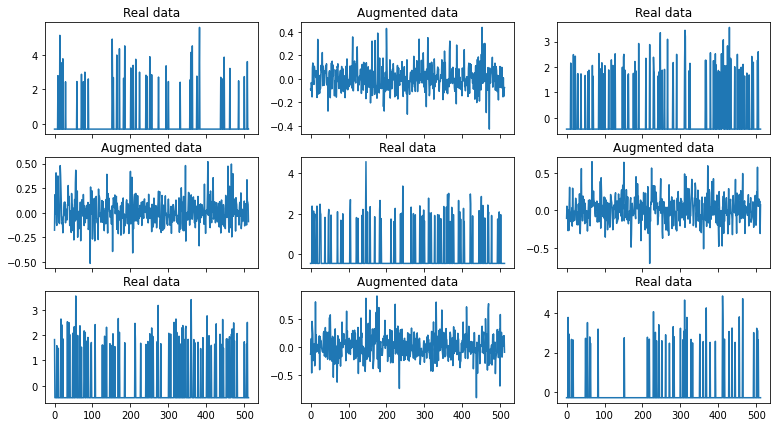

Epoch 390: -197132.844 & 0.000


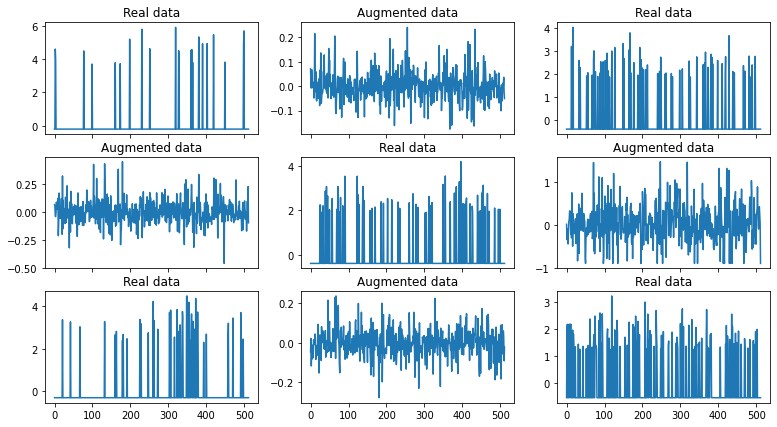

Epoch 400: -228359.277 & 0.000


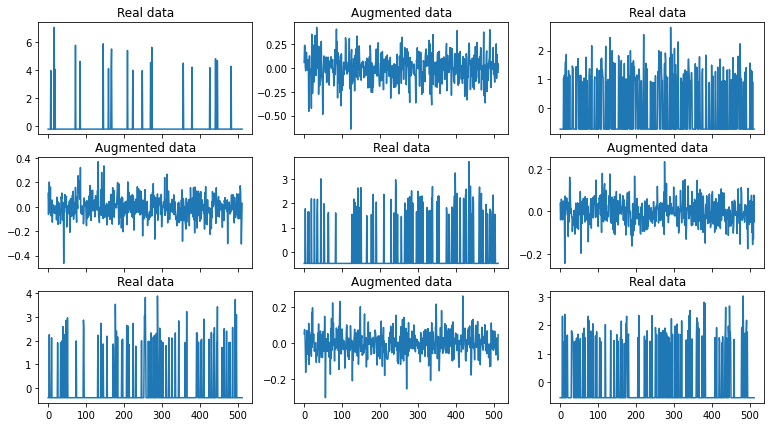

Epoch 410: 213218.203 & 0.000


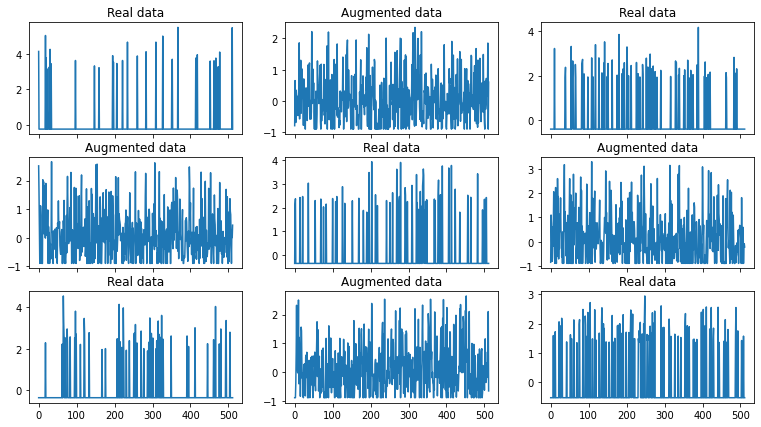

Epoch 420: -171479.262 & 0.000


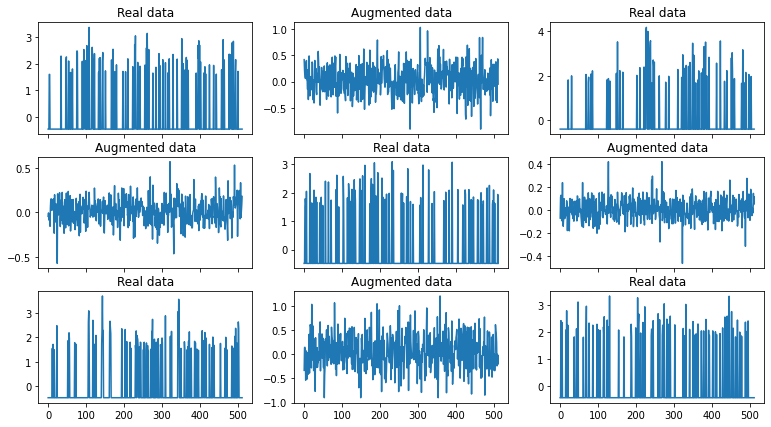

Epoch 430: -116146.111 & 0.000


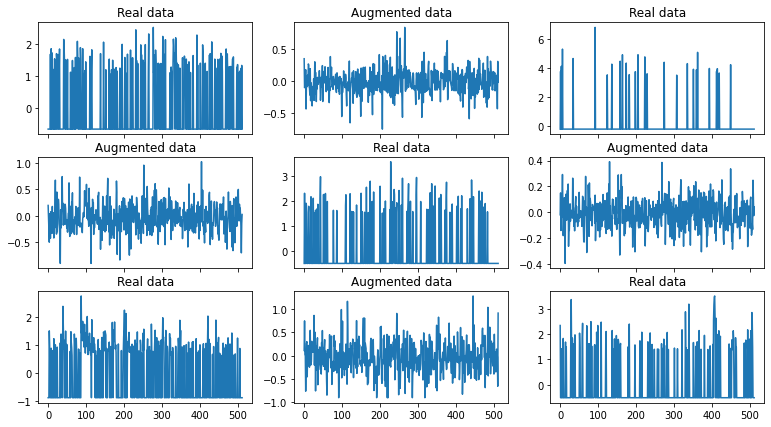

Epoch 440: -183024.570 & 0.000


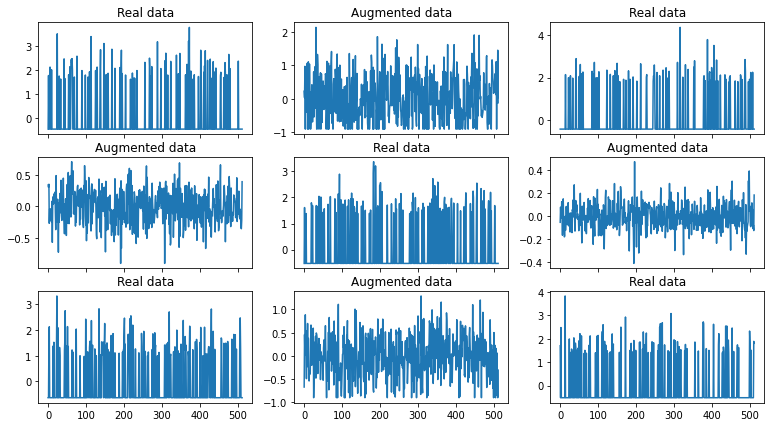

Epoch 450: 55051.668 & 0.000


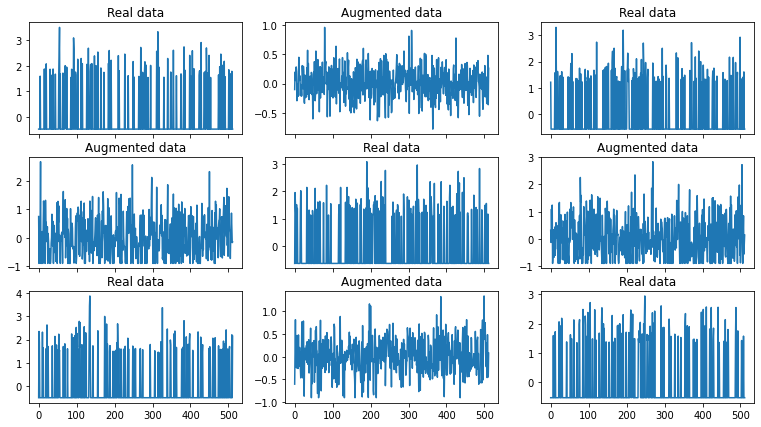

Epoch 460: -419020.164 & 0.000


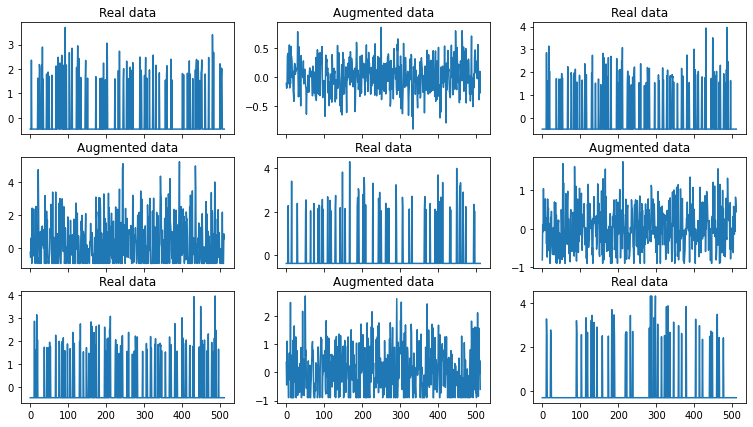

Epoch 470: -255447.676 & 0.000


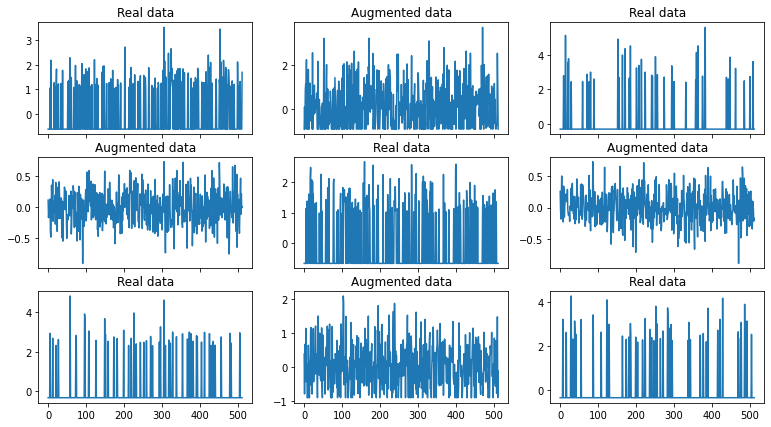

Epoch 480: 157338.254 & 0.000


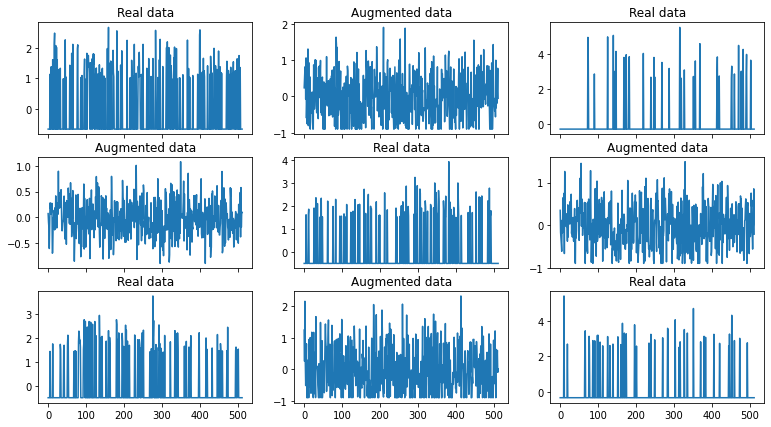

Epoch 490: -303397.074 & 0.000


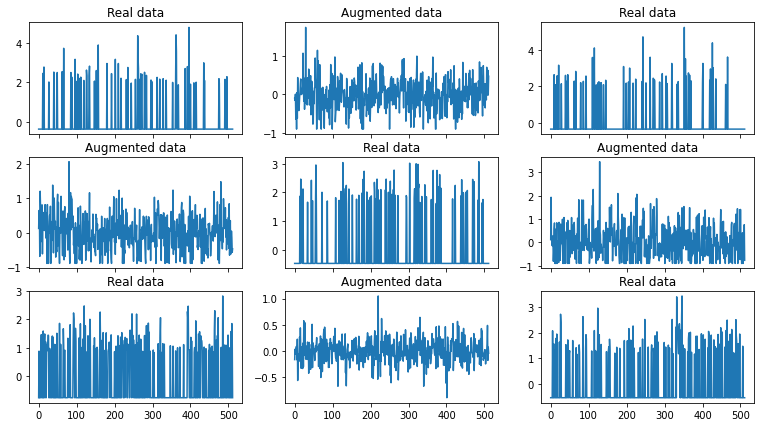

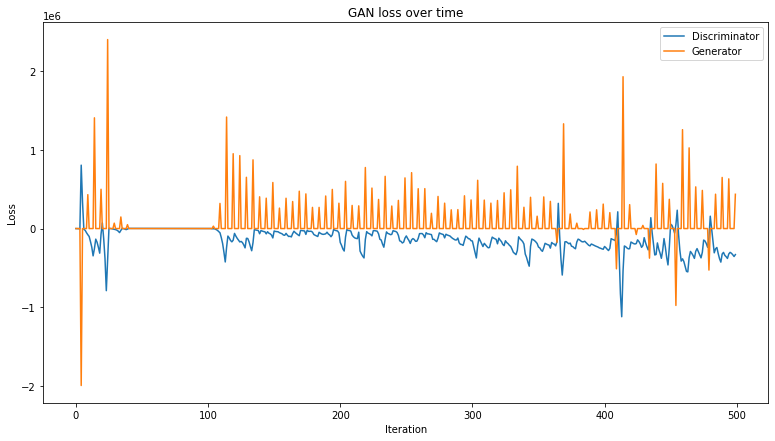

In [16]:
augmenter0 = DataAugmenter(trainLabel0X)
augmenter0.trainModel(epochs=500, criticGeneratorTrainRatio=5, gradClipVal=1, batchSize=64, lrD=0.001, lrG=0.001, savedModelName='Class 0 Augmenter')
augmenter0.plotLossOverTime()

## PCA

In [17]:
# Load the models that were previously stored.
augmenter1 = loadModel('Class 1 Augmenter')
augmenter0 = loadModel('Class 0 Augmenter')

In [18]:
def getPCA(dataset):
  pca = PCA(n_components=2)
  components = pca.fit_transform(dataset)
  c1 = components[:, 0]
  c2 = components[:, 1]
  print('Explained variance ratio: {}'.format(pca.explained_variance_ratio_))
  return c1, c2

In [19]:
def plotPCA(componentsList, colorList, labelList, fileName=None):
  """
  The componentsList should contain a list of tuples. The tuples will contain
  (component1, component2).

  If the fileName parameter is filled, it will save the file. Otherwise,
  it will not be saved.
  """
  plt.figure(figsize=(15,8))
  plt.title('PCA Scatterplot')
  plt.xlabel('PC1')
  plt.ylabel('PC2')

  for i in range(len(componentsList)):
    compTuple = componentsList[i]
    c1 = compTuple[0]
    c2 = compTuple[1]
    color = colorList[i]
    label = labelList[i]
    plt.scatter(c1, c2, color=color, label=label)
  plt.legend()

  if fileName is not None:
    plt.savefig(fileName)

In [20]:
# We create datasets that are regular and shuffled.
augmented1Regular = augmenter1.generateAugmentedDataset(len(trainLabel1X), True, False)
augmented0Regular = augmenter0.generateAugmentedDataset(len(trainLabel0X), True, False)

augmented1Shuffled = augmenter1.generateAugmentedDataset(len(trainLabel1X), True, True)
augmented0Shuffled = augmenter0.generateAugmentedDataset(len(trainLabel0X), True, True)

Explained variance ratio: [0.01127875 0.01102086]
Explained variance ratio: [0.03165017 0.02883265]
Explained variance ratio: [9.99982704e-01 3.97890154e-06]
Explained variance ratio: [0.91323817 0.06419879]
Explained variance ratio: [0.04042021 0.01675087]
Explained variance ratio: [0.16244452 0.10275638]


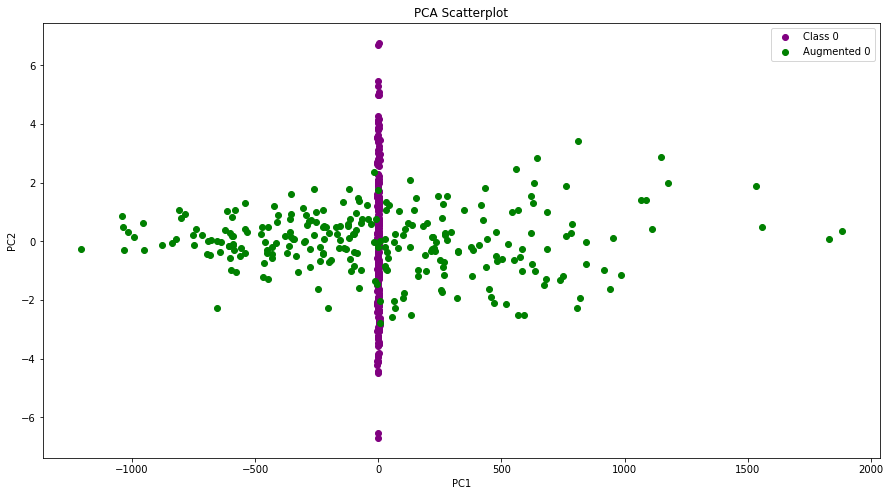

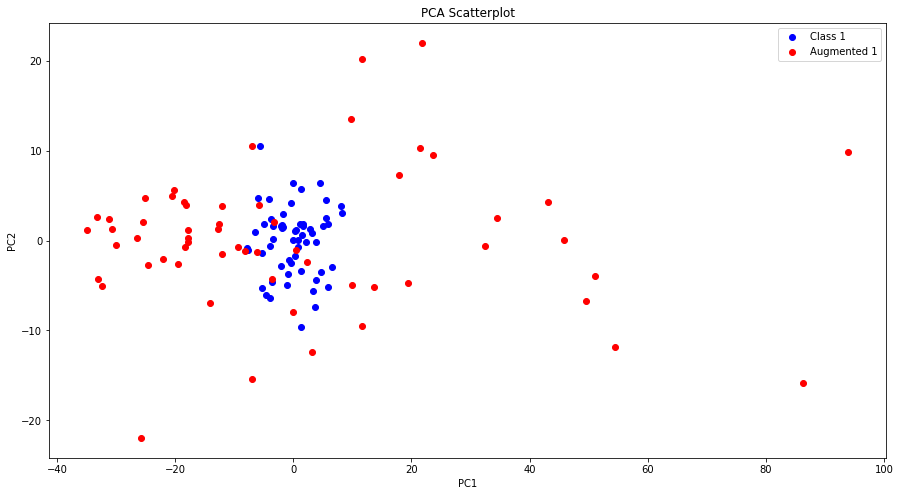

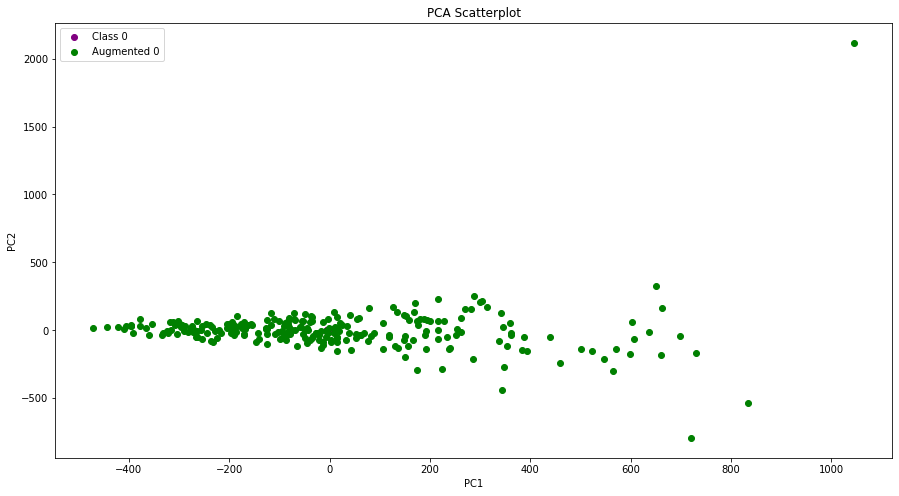

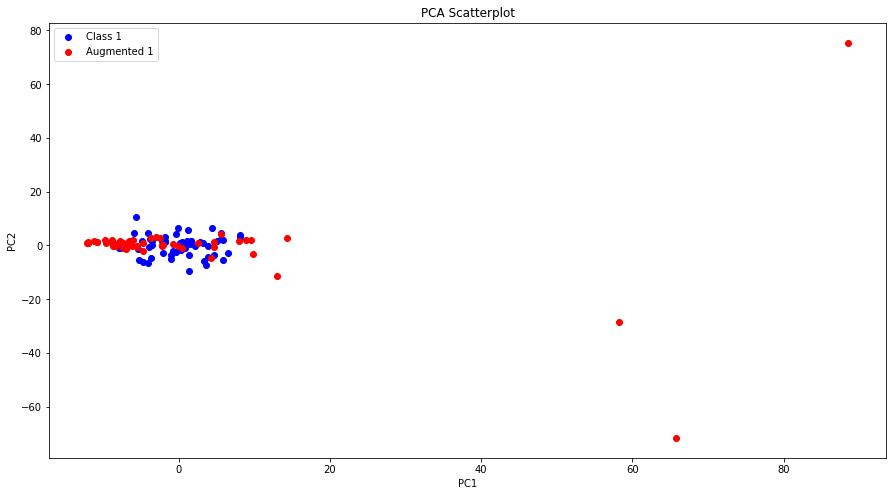

In [21]:
tuple1 = getPCA(trainLabel0X)
tuple2 = getPCA(trainLabel1X)
tuple3 = getPCA(augmented0Regular)
tuple4 = getPCA(augmented1Regular)
tuple5 = getPCA(augmented0Shuffled)
tuple6 = getPCA(augmented1Shuffled)

plotPCA([tuple1, tuple3], ['purple', 'green'], ['Class 0', 'Augmented 0'], fileName='Class 0 PCA Transformer.png')
plotPCA([tuple2, tuple4], ['blue', 'red'], ['Class 1', 'Augmented 1'], fileName='Class 1 PCA Transformer.png')
plotPCA([tuple1, tuple5], ['purple', 'green'], ['Class 0', 'Augmented 0'], fileName='Class 0 PCA Transformer Shuffled.png')
plotPCA([tuple2, tuple6], ['blue', 'red'], ['Class 1', 'Augmented 1'], fileName='Class 1 PCA Transformer Shuffled.png')

## Time Series Classification

### Evaluate model accuracy on original data

Now fitting logistic regression
Now fitting k-nearest-neighbors
Now fitting random forest classifier


,Hyperparam,Hyperparam val,CV Accuracy,Test Accuracy
Model,,,,
Logistic Regression,C,0.01,0.816779,0.733813
KNN,n_neighbors,21,0.819904,0.748201
Random Forest,n_estimators,-,-,0.748201


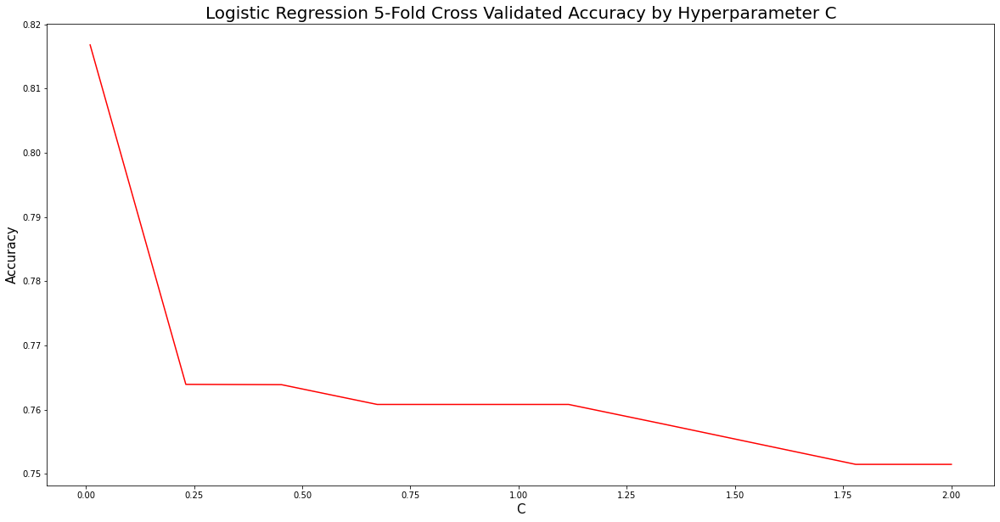

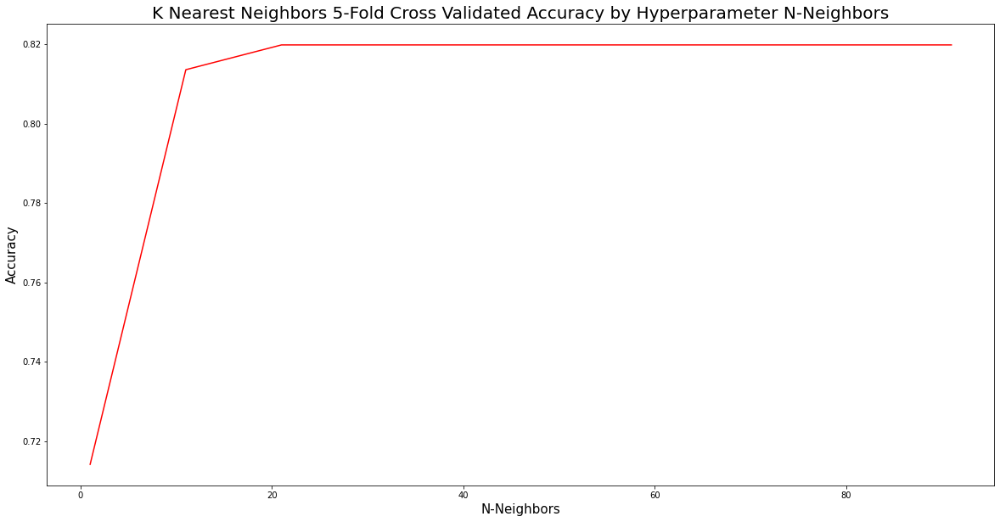

In [22]:
fitter = automator.AutomaticClassification(trainX, trainY, testX, testY)
reportDf = fitter.main([True, False, True, False, True, False])
reportDf

### Create larger datasets through data augmentation

We can see that there are far fewer datasets of class one. That means we need to generate augmented data for that class.

Also, we create a dataset for both shuffled and unshuffled data to compare the results.

#### Shuffled data creation and testing

In [23]:
n = len(trainLabel0X) - len(trainLabel1X)

augmented1 = augmenter1.generateAugmentedDataset(n, True, True)
augmented1 = pd.DataFrame(augmented1)

trainLabel1XCopy = trainLabel1X.copy()
trainLabel0XCopy = trainLabel0X.copy()
trainLabel1XCopy.columns = range(len(trainLabel1XCopy.columns))
trainLabel0XCopy.columns = range(len(trainLabel0XCopy.columns))

augmented1['Target'] = 1
trainLabel1XCopy['Target'] = 1
trainLabel0XCopy['Target'] = 0

# Combine the data.
combinedDf = pd.concat([augmented1, trainLabel1XCopy, trainLabel0XCopy], axis=0)

# Separate out X and Y.
combinedDfTrainX = combinedDf.drop(columns=['Target'])
combinedDfTrainY = combinedDf['Target']

Now fitting logistic regression
Now fitting k-nearest-neighbors
Now fitting random forest classifier


,Hyperparam,Hyperparam val,CV Accuracy,Test Accuracy
Model,,,,
Logistic Regression,C,0.01,0.802588,0.726619
KNN,n_neighbors,71,0.711734,0.338129
Random Forest,n_estimators,-,-,0.719424


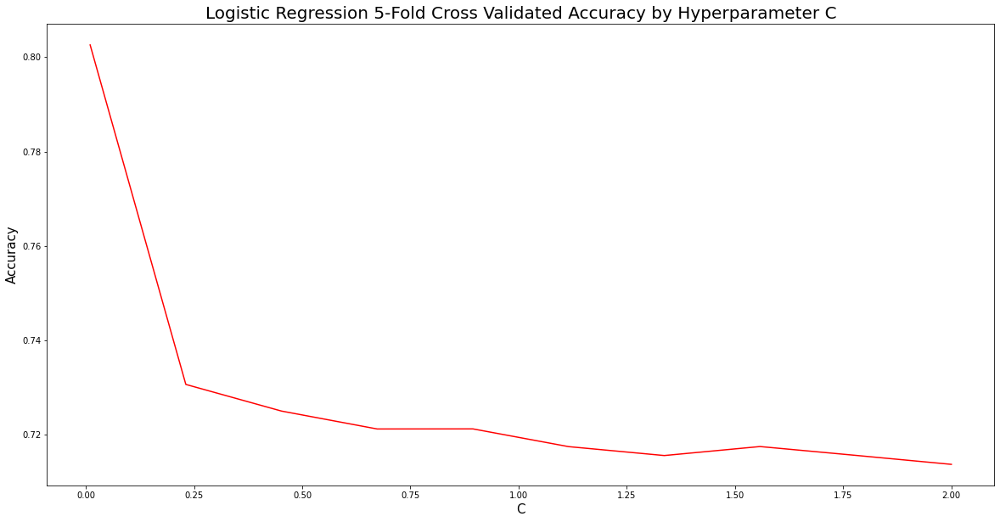

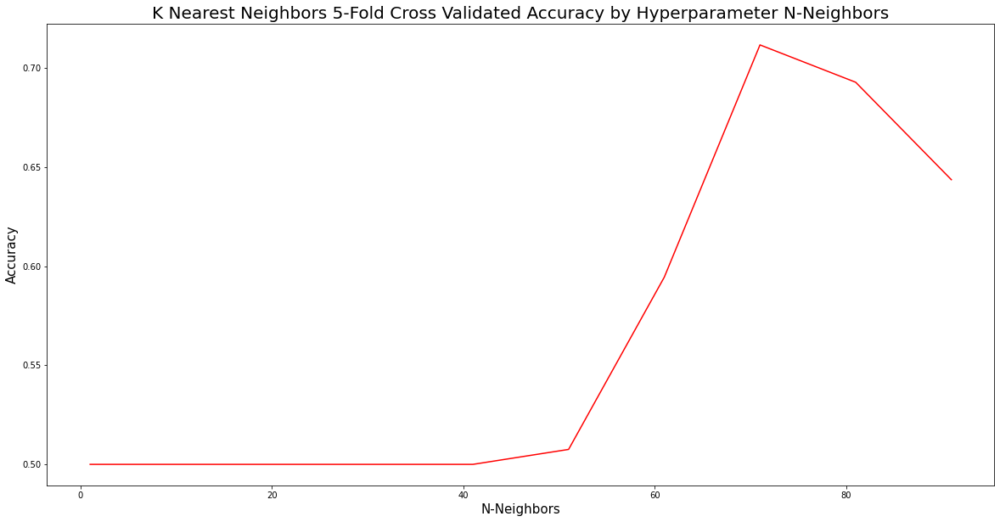

In [24]:
fitter = automator.AutomaticClassification(combinedDfTrainX.values, combinedDfTrainY.values, testX.values, testY.values)
reportDf = fitter.main([True, False, True, False, True, False])
reportDf

#### Unshuffled data creation and testing

In [25]:
n = len(trainLabel0X) - len(trainLabel1X)

augmented1 = augmenter1.generateAugmentedDataset(n, True, False)
augmented1 = pd.DataFrame(augmented1)

trainLabel1XCopy = trainLabel1X.copy()
trainLabel0XCopy = trainLabel0X.copy()
trainLabel1XCopy.columns = range(len(trainLabel1XCopy.columns))
trainLabel0XCopy.columns = range(len(trainLabel0XCopy.columns))

augmented1['Target'] = 1
trainLabel1XCopy['Target'] = 1
trainLabel0XCopy['Target'] = 0

# Combine the data.
combinedDf = pd.concat([augmented1, trainLabel1XCopy, trainLabel0XCopy], axis=0)

# Separate out X and Y.
combinedDfTrainX = combinedDf.drop(columns=['Target'])
combinedDfTrainY = combinedDf['Target']

Now fitting logistic regression
Now fitting k-nearest-neighbors
Now fitting random forest classifier


,Hyperparam,Hyperparam val,CV Accuracy,Test Accuracy
Model,,,,
Logistic Regression,C,0.01,0.880072,0.733813
KNN,n_neighbors,91,0.857538,0.410072
Random Forest,n_estimators,-,-,0.733813


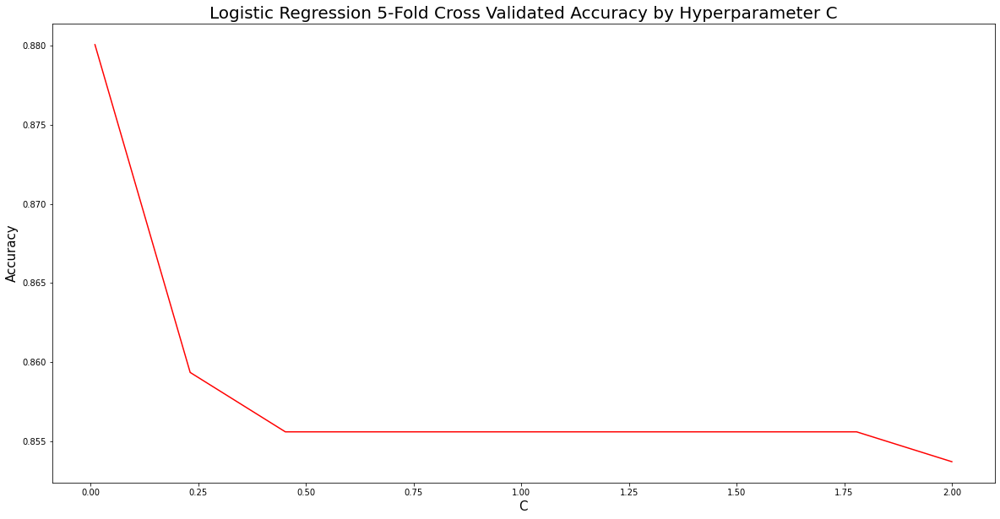

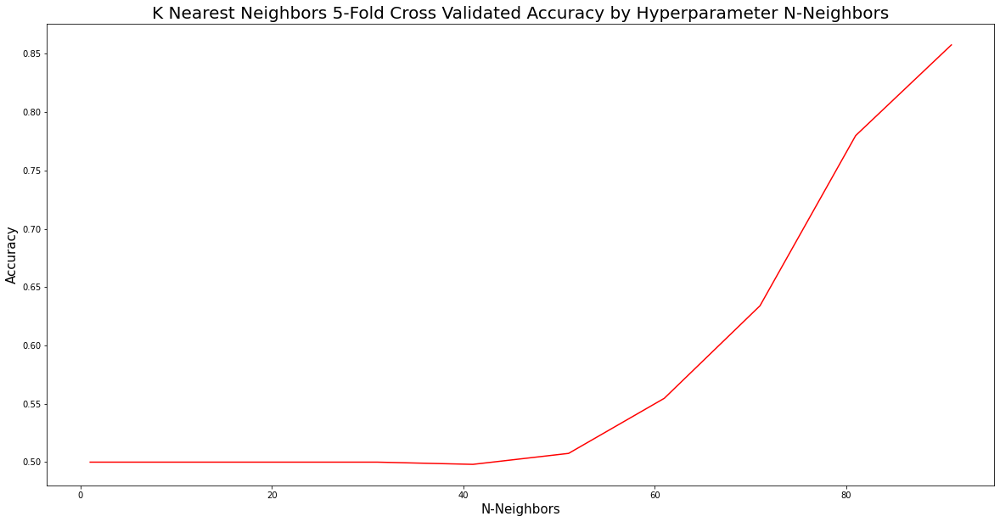

In [26]:
fitter = automator.AutomaticClassification(combinedDfTrainX.values, combinedDfTrainY.values, testX.values, testY.values)
reportDf = fitter.main([True, False, True, False, True, False])
reportDf